In [1]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import plotly.express as px
import pandas as pd
from pathlib import Path
from scipy.signal import convolve
from scipy.signal.windows import triang
from sklearn.decomposition import PCA
from scipy import stats
from utils import *


In [2]:
def set_reproducible_seeds(seed=42):
    """
    Set all random seeds for reproducible results
    """
    import torch
    import numpy as np
    import random
    import os
    random.seed(seed)
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    os.environ['PYTHONHASHSEED'] = str(seed)
    
    print(f"All random seeds set to {seed} for reproducibility")

set_reproducible_seeds(42)


All random seeds set to 42 for reproducibility


In [21]:
# useful for plotting
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6

In [22]:
# loading the data
spike_rows = []

for file in Path("./").glob("*.nio"):
    print(f"Leggo: {file.name}")
    reader = neo.io.NixIO(filename=str(file), mode="ro")
    block = reader.read_block()

    for seg_idx, segment in enumerate(block.segments):
        for st_idx, spiketrain in enumerate(segment.spiketrains):
            spike_times = spiketrain.times.rescale("ms").magnitude
            senders = spiketrain.annotations.get("senders", None)
            device = spiketrain.annotations.get("device", "unknown")
            pop_size = spiketrain.annotations.get("pop_size", None)

            if senders and len(senders) == len(spike_times):
                for time, sender in zip(spike_times, senders):
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": sender,
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })
            else:
                for time in spike_times:
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": f"unit{st_idx}",
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })

df_spikes = pd.DataFrame(spike_rows)
print("Pops:", df_spikes['pop'].unique())

Leggo: f5d958d9-6c30-44be-8757-ebd3421a4600.nio
Leggo: 889130cd-c4c6-49d4-9d9c-58d54698c942.nio
Leggo: 8a2b111a-4a89-4c11-8de4-c016ef0e0984.nio
Leggo: 96e1e91c-1573-4c53-a434-e7b0ec8c0e01.nio
Leggo: 82b0c816-2904-44b9-9e62-bdebef72af84.nio
Leggo: db7b6d82-5fdf-4300-a42b-5259c8faf815.nio
Leggo: ae9d7dd5-d037-46db-a427-11e42709917e.nio
Leggo: c7dea197-26e5-46ac-afed-3dab340f79e3.nio
Pops: ['mossy' 'glomerulus' 'granule' 'golgi' 'purkinje' 'basket' 'stellate'
 'background']


In [23]:
df_spikes.head()

,time_ms,sender_id,pop,segment,file
0,31.3,97,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
1,35.0,41,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
2,48.6,113,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
3,65.3,17,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
4,69.5,9,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio


In [24]:
# maschera PC e id cells
df_analysis_pc = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]
df_analysis_pc

,time_ms,sender_id
74802,7.6,32985
74803,8.5,32977
74804,8.9,32953
74805,9.0,32993
74806,9.2,32961
...,...,...
642702,4986.8,32967
642703,4990.9,32975
642704,4991.1,32951
642705,4992.6,33007


In [25]:
num_neurons = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]['sender_id'].unique().shape
print("Number of neurons:", num_neurons)

Number of neurons: (68,)


In [26]:
# dataframe -> numpy array
purkinje_spikes = np.array(df_analysis_pc)
print("Shape:", purkinje_spikes.shape) # first column is time, second is cell id
print(purkinje_spikes)

Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]


In [27]:
spike_times_pc = df_spikes[df_spikes['pop']=='purkinje'][['time_ms']].values
print("Spike times:", spike_times_pc.shape)
print("Spike times:", spike_times_pc[:10])
print("Spike times dtype:", spike_times_pc.dtype)

Spike times: (15825, 1)
Spike times: [[ 7.6]
 [ 8.5]
 [ 8.9]
 [ 9. ]
 [ 9.2]
 [ 9.3]
 [ 9.8]
 [10. ]
 [24.1]
 [26. ]]
Spike times dtype: float64


In [28]:
neurons_pc = df_spikes[df_spikes['pop']=='purkinje'][['sender_id']].values
print("Neurons:", neurons_pc.shape)
print("Neurons:", neurons_pc[:10])

Neurons: (15825, 1)
Neurons: [[32985]
 [32977]
 [32953]
 [32993]
 [32961]
 [33001]
 [33009]
 [32969]
 [32985]
 [32993]]


Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]
Computing firing rates of purkinje
Number of neurons: 68
Time vector: 0 5000.0
Number of bins: 1000
Kernel size: 40
Neuron ID: 32946.0
First few spikes: [ 9.7 26.3 51.4 75.2 97.2]
Neuron ID: 32947.0
First few spikes: [ 8.8 26.  49.9 72.9 90.1]
Neuron ID: 32948.0
First few spikes: [ 9.3 24.6 48.2 69.6 90.6]
Rates array shape: (68, 1000)
Rates array first few values: [[23.75 26.25 28.25 ... 29.75 28.25 26.25]
 [25.25 27.75 29.75 ... 33.5  31.5  29.75]
 [26.25 28.75 30.75 ... 28.25 26.75 24.75]
 [26.25 28.75 31.   ... 33.   31.   28.75]
 [26.25 28.75 30.75 ... 29.75 27.75 25.25]]
Rates array first few neurons: [[23.75 26.25 28.25 29.75 31.5 ]
 [25.25 27.75 29.75 31.5  33.5 ]
 [26.25 28.75 30.75 32.5  34.5 ]
 [26.25 28.75 31.   33.   35.  ]
 [26.25 28.75 30.75 32.5  34.5 ]
 [24.75 27.25 29.25 31.   33.  ]
 [28.75 31.5 

/home/nix/Uni/3Year/Thesis/testStefania/testStefania/utils.py:234: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


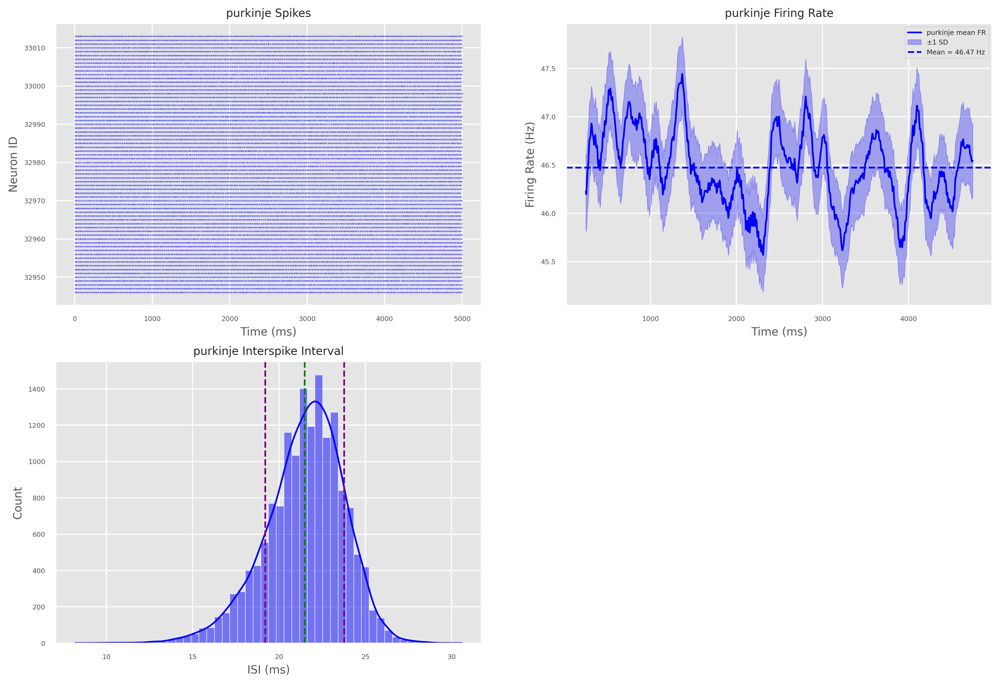

In [29]:
times_vectorPC, mean_ratePC, rates_per_neuronPC, stats_popPC, isi_dictPC, stats_dictPC = process_pop(df_spikes, "purkinje", color="blue", mask_flag=True, dt=5)

In [30]:
rates_per_neuronPC.shape

(68, 900)

# Temporal Correlation Matrix

In [31]:
def compute_temporal_correlation_matrix(rates_array):
    """
    Compute temporal correlation matrix showing how population activity patterns 
    correlate between different time bins.
    
    Each neuron is z-scored (zero mean, unit variance) to focus on relative 
    deviations from individual baselines.
    
    Args:
        rates_array: numpy array of shape (n_neurons, n_time_bins)
    
    Returns:
        correlation_matrix: correlation matrix of shape (n_time_bins, n_time_bins)
    """
    centered_rates = rates_array - np.mean(rates_array, axis=1, keepdims=True)
    
    # Correlation between time bins
    correlation_matrix = np.corrcoef(centered_rates.T)
    
    return correlation_matrix, centered_rates


In [32]:
temporal_correlationPC, centered_ratesPC = compute_temporal_correlation_matrix(rates_per_neuronPC)

In [33]:
def plot_temporal_covariance(cov_matrix, ax, title, time_vector, xlabel="Time (ms)", 
                            ylabel="Time (ms)", save_path=None):
    """
    Plot the temporal covariance matrix.
    """
    max_abs_val = np.max(np.abs(cov_matrix))
    title = f"Standardized Temporal Covariance Matrix: {title}"
    sns.heatmap(cov_matrix, cmap='bwr', ax=ax, 
                cbar=True, vmin=-max_abs_val, vmax=max_abs_val, center=0)
    ax.set_title(title)
    tick_positions = np.arange(0, cov_matrix.shape[0], 50)
    tick_labels = time_vector[::50]
    ax.set_xticks(tick_positions, tick_labels.astype(int), rotation=45)
    ax.set_yticks(tick_positions, tick_labels.astype(int))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    if save_path:
        plt.savefig(save_path)

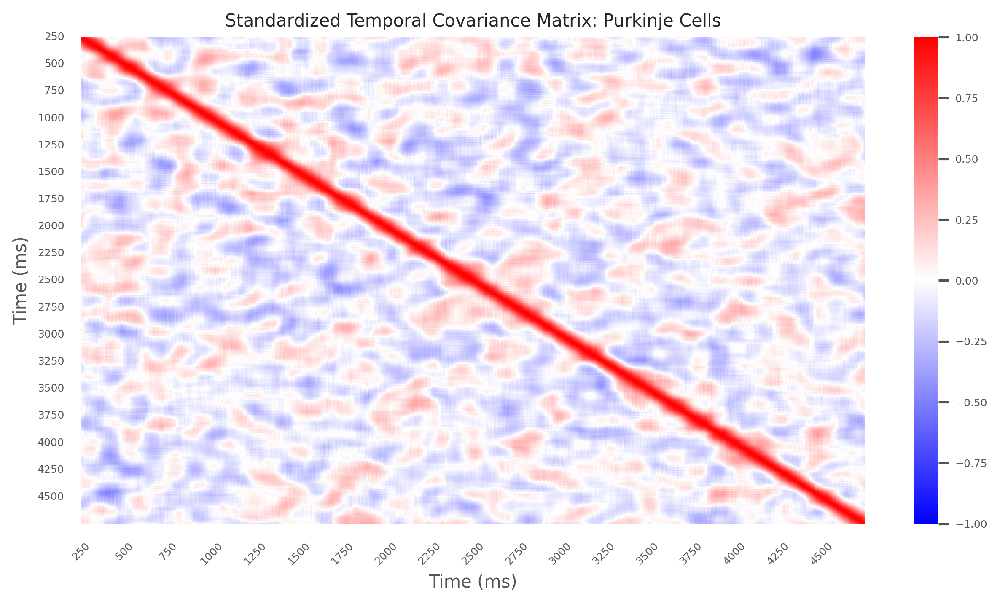

In [34]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=300)

plot_temporal_covariance(temporal_correlationPC, axs, "Purkinje Cells",times_vectorPC, xlabel="Time (ms)", ylabel="Time (ms)", save_path=None)

In [35]:
def compute_pvalue(neurons_rates, cov_matrix):
    n_neurons = neurons_rates.shape[0]
    n_time_bins = neurons_rates.shape[1]

    p_values = np.zeros((n_time_bins, n_time_bins))
    for i in range(n_time_bins):
        for j in range(i, n_time_bins):
            if i == j:
                p_values[i, j] = 1.0
            else:
                r = cov_matrix[i, j]
                t_stat = r * np.sqrt((n_neurons - 2) / (1 - r**2))
                p_value = 2 * (1 - stats.t.cdf(np.abs(t_stat), df=n_neurons - 2))
                p_values[i, j] = p_value
                p_values[j, i] = p_value
    return p_values
p_valuesPC = compute_pvalue(rates_per_neuronPC, temporal_correlationPC)
p_valuesPC

array([[1.        , 0.        , 0.        , ..., 0.40673585, 0.35082834,
        0.36868535],
       [0.        , 1.        , 0.        , ..., 0.48167938, 0.41214327,
        0.41500792],
       [0.        , 0.        , 1.        , ..., 0.48243483, 0.40506057,
        0.39197107],
       ...,
       [0.40673585, 0.48167938, 0.48243483, ..., 1.        , 0.        ,
        0.        ],
       [0.35082834, 0.41214327, 0.40506057, ..., 0.        , 1.        ,
        0.        ],
       [0.36868535, 0.41500792, 0.39197107, ..., 0.        , 0.        ,
        1.        ]])

In [36]:
def plot_pvalues(p_values, ax, title, time_vector, alpha, save_path=None):
    min_val = np.min(p_values)
    max_val = np.max(p_values)
    print(f"Min p-value: {min_val}, Max p-value: {max_val}")
    title = f"P-values of Temporal Covariance Matrix: {title}"
    
    sig_mask = p_values < alpha
    print(f"Significant p-values (alpha={alpha}): {np.sum(sig_mask)} out of {p_values.size}")

    sns.heatmap(p_values, cmap='viridis', ax=ax, 
                cbar=True, vmin=min_val, vmax=max_val, center=0.5)
    ax.contour(sig_mask.astype(int), levels=[0.5], colors='red', linewidths=2)
    ax.set_title(title)
    tick_values = time_vector[::50]
    tick_positions = np.arange(0, p_values.shape[0], 50)
    ax.set_xticks(tick_positions, tick_values.astype(int), rotation=45)
    ax.set_yticks(tick_positions, tick_values.astype(int))
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Time (ms)")
    if save_path:
        plt.savefig(save_path)
    

Min p-value: 0.0, Max p-value: 1.0
Significant p-values (alpha=0.05): 82990 out of 810000


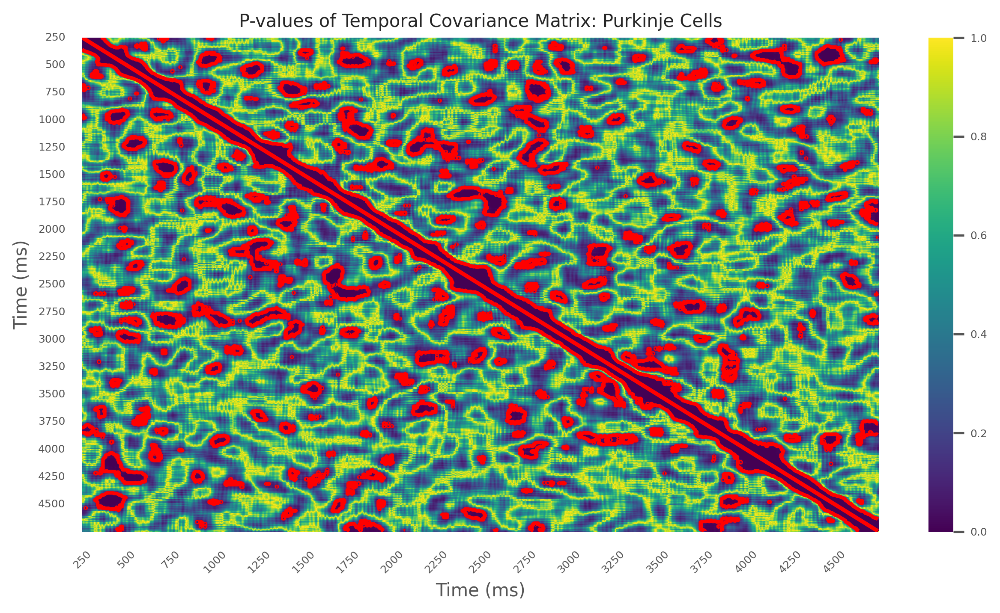

In [37]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=300)
plot_pvalues(p_valuesPC, axs, "Purkinje Cells", times_vectorPC, alpha=0.05, save_path=None)
    

In [38]:
def find_significant_regions(cov_matrix, p_values, time_vector, alpha=0.05, min_region_size=3):
    """
    Find regions of significant correlations in the covariance matrix.
    """
    sig_mask = p_values < alpha
    regions = []
    
    for bin in range(1, min(50, cov_matrix.shape[0])):
        # bin = 1 means b1-> b2, b2 -> b3, etc.
        # bin = 5 we are looking at correlations 10 bins apart
        diagonal_sig = []
        diagonal_corr = []
        diagonal_pvals = []
        for i in range(cov_matrix.shape[0] - bin):
            j = i + bin # position ahead of i

            diagonal_sig.append(sig_mask[i, j])
            diagonal_corr.append(cov_matrix[i, j])
            diagonal_pvals.append(p_values[i, j])
        diagonal_sig = np.array(diagonal_sig)
        diagonal_corr = np.array(diagonal_corr)
        diagonal_pvals = np.array(diagonal_pvals)

    # If cov_matrix is 5x5, for bin=1:
    # i=0, j=1 → correlation between time bin 0 and 1
    # i=1, j=2 → correlation between time bin 1 and 2  
    # i=2, j=3 → correlation between time bin 2 and 3
    # i=3, j=4 → correlation between time bin 3 and 4

    # Step 4: Find consecutive runs of significant correlations
        consecutive_runs = find_consecutive_runs(diagonal_sig, min_region_size)
    # This returns [(start_idx, end_idx), (start_idx, end_idx), ...]
    # For example: [(2, 6), (10, 14)] means two regions found
    
    # Step 5: For each consecutive run, create a region entry
        for start_idx, end_idx in consecutive_runs:
            region_length = end_idx - start_idx + 1
            
            # Extract the correlation values for this specific region
            region_correlations = diagonal_corr[start_idx:end_idx+1]
            region_pvals = diagonal_pvals[start_idx:end_idx+1]
            
            region = {
                'type': 'diagonal',
                'lag_bins': bin,                                                
                'lag_time_ms': bin * (time_vector[1] - time_vector[0]),       
                'start_bin': start_idx,                                        
                'end_bin': end_idx,                                           
                'region_length': region_length,                               
                'start_time': time_vector[start_idx],                         
                'end_time': time_vector[end_idx],                            
                'mean_correlation': np.mean(region_correlations),             
                'std_correlation': np.std(region_correlations),              
                'mean_p_value': np.mean(region_pvals),                       
                'min_p_value': np.min(region_pvals),                         
                'bin_pairs': [(i, i + bin) for i in range(start_idx, end_idx + 1)]  
            }
            regions.append(region)

    return regions

def find_consecutive_runs(sig_mask, min_region_size=4):
    """
    Find consecutive True values in a boolean array.
    
    Example:
    boolean_array = [False, True, True, True, False, False, True, True, False]
    This should find: [(1, 3), (6, 7)] if min_length = 2
    """

    # Step A: Add padding to make edge detection easier
    # [F, T, T, T, F, F, T, T, F] becomes [F, F, T, T, T, F, F, T, T, F, F]
    padded = np.concatenate(([False], sig_mask, [False]))
    
    # Step B: Find transitions by looking at differences
    # [F, F, T, T, T, F, F, T, T, F, F] → [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]
    diff = np.diff(padded.astype(int))
    # diff = [0, 1, 0, 0, -1, 0, 1, 0, -1, 0]
    
    # Step C: Find start and end positions
    starts = np.where(diff == 1)[0]  # Where it goes from 0→1 (False→True)
    ends = np.where(diff == -1)[0] - 1  # Where it goes from 1→0 (True→False)
    
    # Step D: Filter by minimum length
    valid_runs = [(start, end) for start, end in zip(starts, ends) 
                  if (end - start + 1) >= min_region_size]
    
    return valid_runs


In [39]:
regions_significantPC = find_significant_regions(temporal_correlationPC, p_valuesPC, times_vectorPC, alpha=0.05, min_region_size=4)

In [40]:
def analyze_regions_summary(regions):
    positive_regions = []
    negative_regions = []

    for i, region in enumerate(regions):
        if region['mean_correlation'] > 0 and region['mean_correlation'] < 0.6:
            positive_regions.append(region)
        else:
            negative_regions.append(region)

    print(f"Positive correlation regions: {len(positive_regions)}")
    print(f"Negative correlation regions: {len(negative_regions)}")
    return positive_regions, negative_regions
positive_regionsPC, negative_regionsPC = analyze_regions_summary(regions_significantPC)

Positive correlation regions: 240
Negative correlation regions: 54


In [41]:
def select_regions(positive_regions, negative_regions):
    best_positive = None
    best_negative = None
    if positive_regions:
        positive_sorted = sorted(positive_regions, key=lambda x: x['mean_correlation'], reverse=True)
        best_positive = positive_sorted[10]
        print(f"\nBEST POSITIVE REGION:")
        print(f"  Correlation: {best_positive['mean_correlation']:.3f}")
        print(f"  Lag: {best_positive['lag_bins']} bins ({best_positive['lag_time_ms']:.1f} ms)")
        print(f"  Time: {best_positive['start_time']:.1f} - {best_positive['end_time']:.1f} ms")
        print(f"  Bin pairs: {best_positive['bin_pairs'][:3]}...")
    
    if negative_regions:
        negative_sorted = sorted(negative_regions, key=lambda x: x['mean_correlation'])
        best_negative = negative_sorted[0]
        print(f"\nBEST NEGATIVE REGION:")
        print(f"  Correlation: {best_negative['mean_correlation']:.3f}")
        print(f"  Lag: {best_negative['lag_bins']} bins ({best_negative['lag_time_ms']:.1f} ms)")
        print(f"  Time: {best_negative['start_time']:.1f} - {best_negative['end_time']:.1f} ms")
        print(f"  Bin pairs: {best_negative['bin_pairs'][:3]}...")
    
    return best_positive, best_negative
best_positivePC, best_negativePC = select_regions(positive_regionsPC, negative_regionsPC)



BEST POSITIVE REGION:
  Correlation: 0.447
  Lag: 16 bins (80.0 ms)
  Time: 3295.0 - 4340.0 ms
  Bin pairs: [(609, 625), (610, 626), (611, 627)]...

BEST NEGATIVE REGION:
  Correlation: -0.346
  Lag: 45 bins (225.0 ms)
  Time: 3200.0 - 3270.0 ms
  Bin pairs: [(590, 635), (591, 636), (592, 637)]...


In [42]:
# In your case with your function:
def plot_neural_activity_for_region(region, rates_array, time_vector, pop, color, n_neurons_to_plot=8):
    # our analysis with respect to pair of bins shifted by a lag which is = 20
    # so if first bin is 0, second bin is 20
    # so we have two different periods of activity
    bin_pairs = region['bin_pairs']  # Example: [(0, 11), (1, 12), (2, 13), ...]
    lag = region['lag_bins']         # Example: 11
    
    time_bins_1 = [pair[0] for pair in bin_pairs]  # [0, 1, 2, ...] - Earlier times
    time_bins_2 = [pair[1] for pair in bin_pairs]  # [11, 12, 13, ...] - Later times
    
    print(f"Lag = {lag}")
    print(f"We're comparing:")
    for i in range(min(5, len(bin_pairs))):  # Show first 5 pairs
        t1_ms = time_vector[bin_pairs[i][0]]
        t2_ms = time_vector[bin_pairs[i][1]]
        print(f"  Time bin {bin_pairs[i][0]} ({t1_ms:.1f}ms) vs Time bin {bin_pairs[i][1]} ({t2_ms:.1f}ms)")
    
    # Extract neural activity for these time periods
    activity_period_1 = rates_array[:, time_bins_1]  # Activity at earlier times
    activity_period_2 = rates_array[:, time_bins_2]  # Activity at later times (lag offset)
    print(f"Activity shape for period 1: {activity_period_1.shape}")
    print(f"Activity shape for period 2: {activity_period_2.shape}")

    neuron_variability = np.std(rates_array, axis=1)  # Variability across time bins for each neuron
    print(f"Neuron variability shape: {neuron_variability.shape}")
    # Sort neurons by variability
    sorted_neurons = np.argsort(neuron_variability)[-n_neurons_to_plot:] 
    print(f"Most variable neurons: {sorted_neurons}")
    print(f"Their variabilities: {neuron_variability[sorted_neurons]}")

    fig, axs = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
    # time bins to actual times
    time1 = time_vector[time_bins_1]
    time2 = time_vector[time_bins_2]

    print(time1[:5], time2[:5])
    axs1 = axs[0, 0]
    axs2 = axs[0, 1]
    axs1.set_title(f"Neural Activity at Time Bins)")
    axs2.set_title(f"Neural Activity at Time Bins)")
    for neuron_idx in sorted_neurons:
        axs1.plot(time1, activity_period_1[neuron_idx], label=f'Neuron {neuron_idx}', alpha=0.5)
        axs2.plot(time2, activity_period_2[neuron_idx], label=f'Neuron {neuron_idx}', alpha=0.5)
    axs1.set_xlabel("Time (ms)")
    axs1.set_ylabel("Firing Rate (Hz)")
    axs2.set_xlabel("Time (ms)")
    axs2.set_ylabel("Firing Rate (Hz)")
    axs1.legend(loc='upper right', fontsize='small')
    axs2.legend(loc='upper right', fontsize='small')

    # scatter plot of average activity
    average_activity_1 = np.mean(activity_period_1, axis=1)
    average_activity_2 = np.mean(activity_period_2, axis=1)
    axs3 = axs[1, 0]
    axs3.set_title(f"Average Activity at Time Bins)")
    axs3.scatter(average_activity_1, average_activity_2, alpha=0.5, color=color, s=30)
    axs3.scatter(average_activity_1[sorted_neurons], average_activity_2[sorted_neurons], alpha=0.8, color=color, s=50)
    axs3.set_xlabel("Average Activity at Earlier Times (Period One) (Hz)")
    axs3.set_ylabel("Average Activity at Later Times (Period Two) (Hz)")

    correlation = np.corrcoef(average_activity_1, average_activity_2)[0, 1]
    min_val = min(np.min(average_activity_1), np.min(average_activity_2))
    max_val = max(np.max(average_activity_1), np.max(average_activity_2))
    if region['mean_correlation'] > 0:
        axs3.plot([min_val, max_val], [min_val, max_val], color=color, linestyle='--', label='y=x')
    else:
        axs3.plot([min_val, max_val], [max_val, min_val], color=color, linestyle='--', label='y=-x')
    axs3.set_title(f'Cross-Period Correlation\nr = {correlation:.3f}')

    axs4 = axs[1, 1]
    axs4.set_title('Distribution of Activity Changes')
    axs4.set_xlabel('Activity Change (Period 2 - Period 1) Hz')
    axs4.set_ylabel('Number of Neurons')
    activity_change = average_activity_2 - average_activity_1
    sns.histplot(activity_change, bins=30, kde=True, ax=axs4, color=color, alpha=0.5)
    axs4.axvline(0, color=color, linestyle='--', label='No Change')

    axis = axs.flatten()
    for ax in axis:
        ax.grid(True, alpha=0.3)
    fig.suptitle(f"Neural Activity Analysis for {pop} - Region: {region['start_time']:.1f} to {region['end_time']:.1f} ms\n"
                 f"Mean Correlation: {region['mean_correlation']:.3f}, Lag: {region['lag_bins']} bins ({region['lag_time_ms']:.1f} ms)",
                 fontsize=14)
    plt.tight_layout()
    plt.show()

Lag = 16
We're comparing:
  Time bin 609 (3295.0ms) vs Time bin 625 (3375.0ms)
  Time bin 610 (3300.0ms) vs Time bin 626 (3380.0ms)
  Time bin 611 (3305.0ms) vs Time bin 627 (3385.0ms)
  Time bin 612 (3310.0ms) vs Time bin 628 (3390.0ms)
  Time bin 613 (3315.0ms) vs Time bin 629 (3395.0ms)
Activity shape for period 1: (68, 210)
Activity shape for period 2: (68, 210)
Neuron variability shape: (68,)
Most variable neurons: [14 35 37  5  1 40  6 16]
Their variabilities: [2.57481084 2.57834158 2.58375891 2.609504   2.6111634  2.61256725
 2.64624099 2.66498332]
[3295. 3300. 3305. 3310. 3315.] [3375. 3380. 3385. 3390. 3395.]


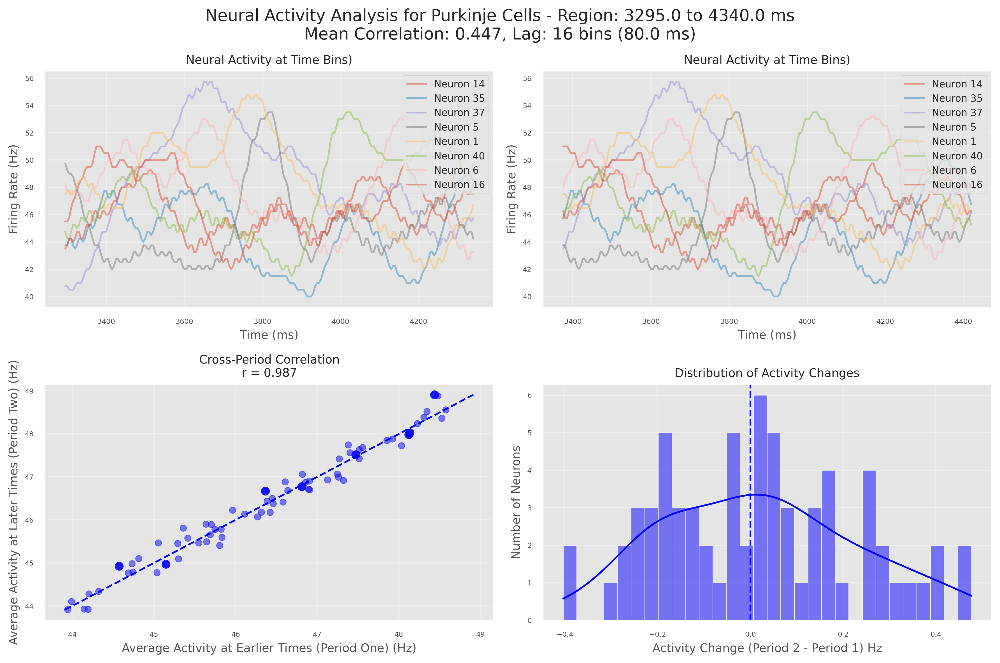

In [43]:
plot_neural_activity_for_region(best_positivePC, rates_per_neuronPC, times_vectorPC, "Purkinje Cells", 'blue', n_neurons_to_plot=8)

Lag = 45
We're comparing:
  Time bin 590 (3200.0ms) vs Time bin 635 (3425.0ms)
  Time bin 591 (3205.0ms) vs Time bin 636 (3430.0ms)
  Time bin 592 (3210.0ms) vs Time bin 637 (3435.0ms)
  Time bin 593 (3215.0ms) vs Time bin 638 (3440.0ms)
  Time bin 594 (3220.0ms) vs Time bin 639 (3445.0ms)
Activity shape for period 1: (68, 15)
Activity shape for period 2: (68, 15)
Neuron variability shape: (68,)
Most variable neurons: [14 35 37  5  1 40  6 16]
Their variabilities: [2.57481084 2.57834158 2.58375891 2.609504   2.6111634  2.61256725
 2.64624099 2.66498332]
[3200. 3205. 3210. 3215. 3220.] [3425. 3430. 3435. 3440. 3445.]


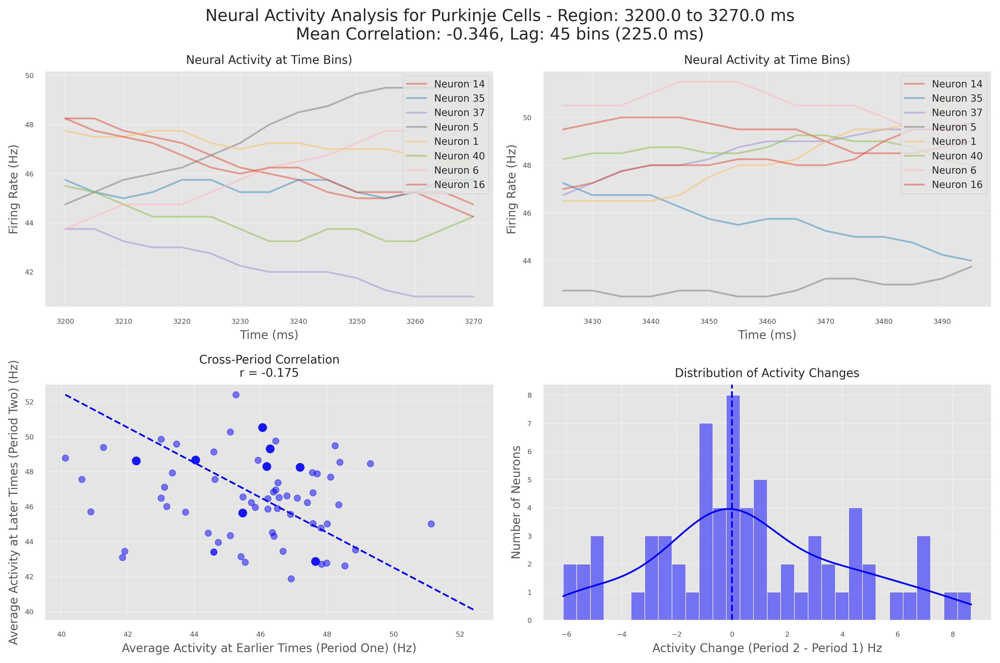

In [44]:
plot_neural_activity_for_region(best_negativePC, rates_per_neuronPC, times_vectorPC, "Purkinje Cells", 'blue', n_neurons_to_plot=8)

In [45]:
def off_diagonal_stats(cov_matrix):
    """
    Compute mean and variance of off-diagonal elements.
    Args:
        cov_matrix: 2D numpy array (square)
    Returns:
        mean_offdiag: mean of off-diagonal elements
        var_offdiag: variance of off-diagonal elements
    """
    n = cov_matrix.shape[0]
    mask = ~np.eye(n, dtype=bool) # remove diagonal
    off_diag_vals = cov_matrix[mask]
    mean_offdiag = np.mean(off_diag_vals)
    var_offdiag = np.var(off_diag_vals)
    return mean_offdiag, var_offdiag

# mean_off_mf, var_off_mf = off_diagonal_stats(temporal_covarianceMF)
mean_off_pc, var_off_pc = off_diagonal_stats(temporal_correlationPC)

# print(f"Mossy fibers off-diagonal mean: {mean_off_mf:.4f}, variance: {var_off_mf:.4f}")
print(f"Purkinje cells off-diagonal mean: {mean_off_pc:.4f}, variance: {var_off_pc:.4f}")


Purkinje cells off-diagonal mean: -0.0010, variance: 0.0380


In [46]:
def perform_pca(corr_matrix, n_components=None):
    """
    Perform PCA on corellation matrix.

    Args:
        cov_matrix: 2D numpy array (square)
        n_components: number of principal components to extract

    Returns:
        pca: fitted PCA object
        components: principal components (eigenvectors)
        explained_variance: explained variance ratios
    """
    if n_components is None:
        pca = PCA()
    else:
        pca = PCA(n_components=n_components)
    components = pca.fit_transform(corr_matrix)
    explained_variance_ratio = pca.explained_variance_ratio_
    eigenvalues = pca.explained_variance_
    return pca, components, explained_variance_ratio, eigenvalues

In [47]:
pca_pc, comps_pc, var_pc, eigen_val_pc = perform_pca(temporal_correlationPC)
print("Purkinje cells explained variance ratios:", var_pc[:3])
print("Purkinje cells total variance:", np.sum(eigen_val_pc))

Purkinje cells explained variance ratios: [0.15060199 0.12415338 0.11364414]
Purkinje cells total variance: 35.15716072549921


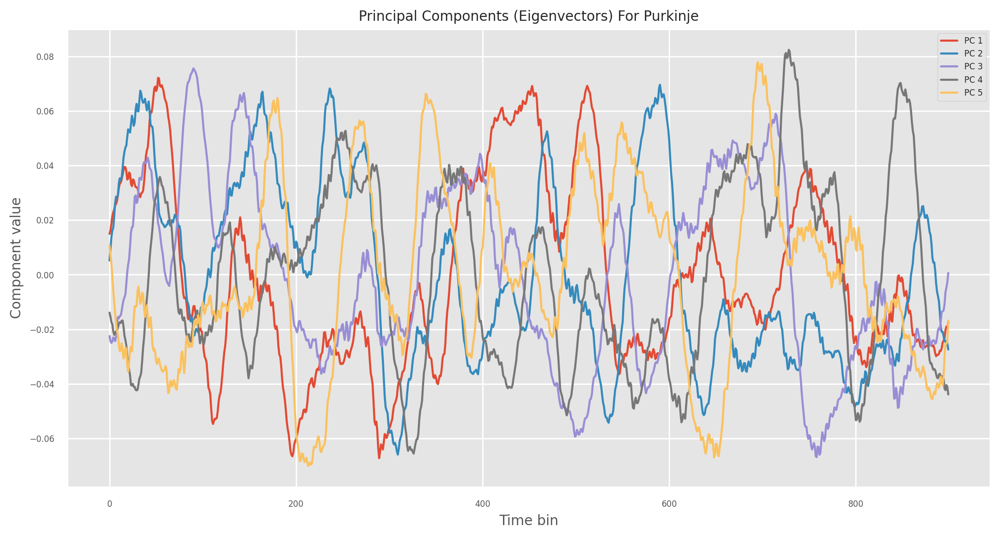

In [48]:
def plot_eigenvectors(pca, pop, n_components=3):
    plt.figure(figsize=(12, 6))
    for i in range(n_components):
        plt.plot(pca.components_[i], label=f'PC {i+1}')
    plt.xlabel('Time bin')
    plt.ylabel('Component value')
    plt.title(f'Principal Components (Eigenvectors) For {pop}')
    plt.legend()
    plt.show()

plot_eigenvectors(pca_pc, 'Purkinje', n_components=5)

In [49]:
def fourier_trasformPCA(pca, n_components=3):
    """
    Perform Fourier Transform on PCA components.

    Args:
        pca: fitted PCA object
        n_components: number of principal components to transform

    Returns:
        freqs: frequencies corresponding to the Fourier Transform
        fft_values: Fourier Transform values
    """
    fft_values = []
    fft_freqs = []
    for i in range(n_components):
        fft_values.append(np.fft.rfft(pca.components_[i]))
        fft_freqs.append(np.fft.rfftfreq(pca.components_[i].shape[0]))
  
    return fft_freqs, fft_values

def plot_fourier_transform(fft_freqs, fft_values, pop, n_components=3):
    plt.figure(figsize=(12, 6))
    for i in range(n_components):
        plt.plot(fft_freqs[i], np.abs(fft_values[i]), label=f'PC {i+1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.title(f'Fourier Transform of PCA Components For {pop}')
    plt.legend()
    plt.show()

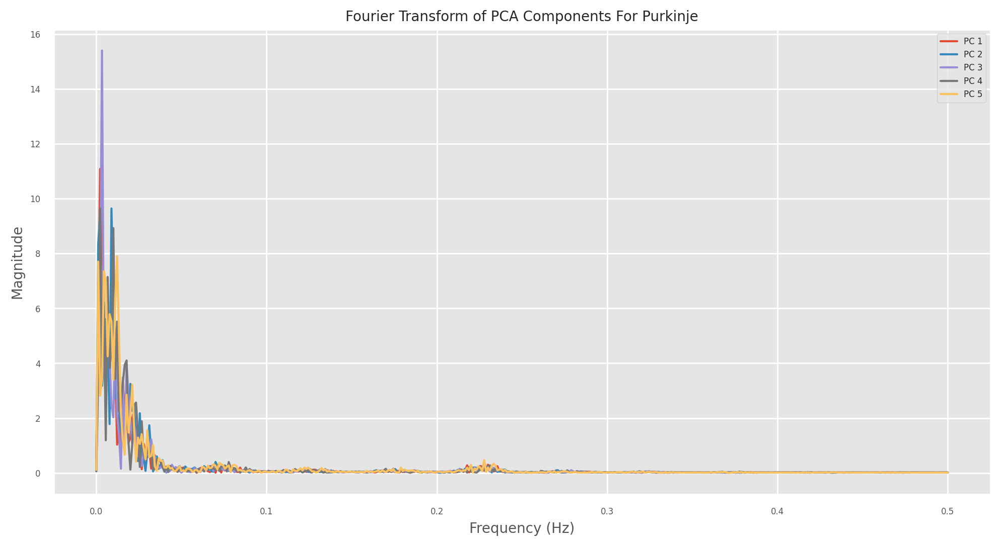

In [50]:
fft_freqs_pc, fft_values_pc = fourier_trasformPCA(pca_pc, n_components=5)
plot_fourier_transform(fft_freqs_pc, fft_values_pc, 'Purkinje', n_components=5)

Temporal components shape: (900, 900)


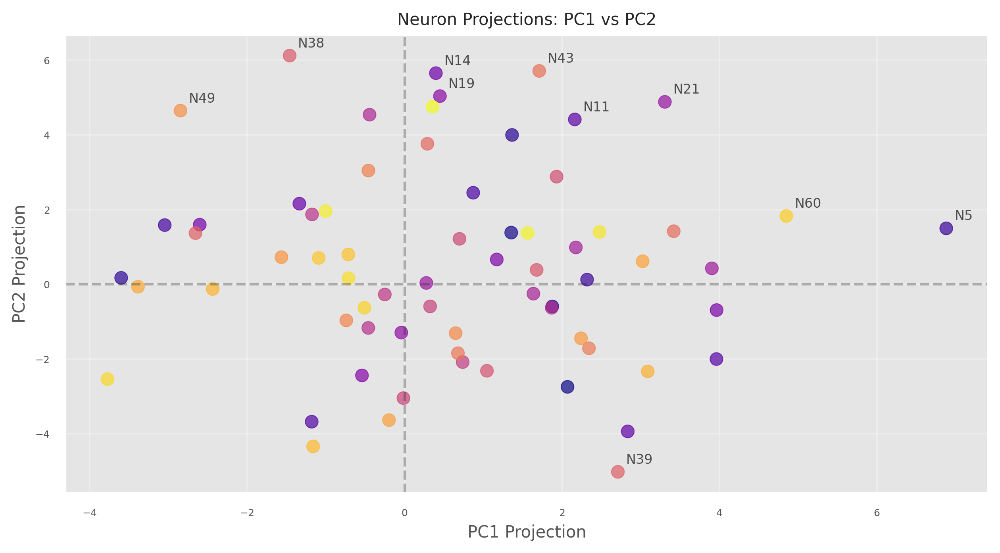

In [51]:
def project_neurons_using_temporal_pca(rates_neurons, temporal_pca, n_components_to_show=5):
    """
    Project neurons based on how much they contribute to temporal patterns
    
    Args:
        rates_neurons: (n_neurons, n_time_bins) - neuron firing rates
        temporal_pca: fitted PCA object 
        temporal_components: PCA components (time_bins, n_components)
        n_components_to_show: number of components to analyze
    """
    n_neurons, n_time_bins = rates_neurons.shape
    temporal_components = temporal_pca.components_
    print(f"Temporal components shape: {temporal_components.shape}")
    n_components = min(n_components_to_show, temporal_components.shape[1])
    
    neuron_contributions = np.zeros((n_neurons, n_components))
    
    # DOT PRODUCT PROJECTION (PCA SCORES)
    for neuron_idx in range(n_neurons):
        neuron_activity = rates_neurons[neuron_idx, :]
       
        for pc_idx in range(n_components):
            temporal_pattern = temporal_components[:, pc_idx]
            
            if len(neuron_activity) == len(temporal_pattern):
                projection = np.dot(neuron_activity, temporal_pattern)
                neuron_contributions[neuron_idx, pc_idx] = projection
    
    fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
    
    scatter1 = ax.scatter(neuron_contributions[:, 0], neuron_contributions[:, 1], 
                          alpha=0.7, s=60, c=range(n_neurons), cmap='plasma')

    contribution_magnitude = np.sqrt(neuron_contributions[:, 0]**2 + neuron_contributions[:, 1]**2)
    top_contributors = np.argsort(contribution_magnitude)[-10:]  # Top 10 contributors
    
    for i in top_contributors:
        ax.annotate(f'N{i}', (neuron_contributions[i, 0], neuron_contributions[i, 1]), 
                    xytext=(5, 5), textcoords='offset points', fontsize=8, alpha=0.8)
    
    ax.set_title('Neuron Projections: PC1 vs PC2')
    ax.set_xlabel('PC1 Projection')
    ax.set_ylabel('PC2 Projection')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax.axvline(x=0, color='k', linestyle='--', alpha=0.3)
    ax.grid(True, alpha=0.3)
    
    return neuron_contributions

neuron_temporal_contributions = project_neurons_using_temporal_pca(
    centered_ratesPC, pca_pc, n_components_to_show=3
)

In [52]:
print("Neuron contributions shape:", neuron_temporal_contributions.shape)

Neuron contributions shape: (68, 3)


# More Spectral Analysis Using FOOF
The FOOOF object fits models to power spectra. The module itself does not compute power spectra. Computing power spectra needs to be done prior to using the FOOOF module. Thus I need to first compute the spectrum using Welch

Welch’s method computes an estimate of the power spectral density by dividing the data into overlapping segments, computing a modified periodogram for each segment and averaging the periodograms

In [53]:
rates_per_neuronPC.shape

(68, 900)

In [54]:
help(np.fft.fft)

Help on _ArrayFunctionDispatcher in module numpy.fft:

fft(a, n=None, axis=-1, norm=None, out=None)
    Compute the one-dimensional discrete Fourier Transform.

    This function computes the one-dimensional *n*-point discrete Fourier
    Transform (DFT) with the efficient Fast Fourier Transform (FFT)
    algorithm [CT].

    Parameters
    ----------
    a : array_like
        Input array, can be complex.
    n : int, optional
        Length of the transformed axis of the output.
        If `n` is smaller than the length of the input, the input is cropped.
        If it is larger, the input is padded with zeros.  If `n` is not given,
        the length of the input along the axis specified by `axis` is used.
    axis : int, optional
        Axis over which to compute the FFT.  If not given, the last axis is
        used.
    norm : {"backward", "ortho", "forward"}, optional
        .. versionadded:: 1.10.0

        Normalization mode (see `numpy.fft`). Default is "backward".
        I

In [101]:
from scipy.signal import welch

def compute_power_spectrum(rates_array, dt=0.1, nperseg=512):
    """
    Compute power spectrum using Welch's method.
    
    Args:
        rates_array: 2D numpy array of shape (n_neurons, n_time_bins)
        dt: time step in ms (from your firing rate computation)
        nperseg: length of each segment for Welch's method

    Returns:
        freqs: frequencies corresponding to the power spectrum (in Hz)
        psd: power spectral density values
    """
    dt_s = dt / 1000.0
    fs =  1 / dt_s  
    print(fs)
    
    psd = []
    
    for neuron_rates in rates_array:
        f, p = welch(neuron_rates, fs=fs, nperseg=nperseg, detrend='constant')
        print(p.shape)
        psd.append(p)

    freqs = np.array(f)
    freqs = freqs[1:]
    psd = np.array(psd)[:, 1:]
    print(f"Computed power spectrum for {rates_array.shape[0]} neurons with {len(freqs)} frequency bins.")
    
    
    return freqs, psd

def plot_power_spectrum(freqs, psd, pop, n_neurons_to_plot=8):
    """
    Plot power spectrum for a given population.
    
    Args:
        freqs: frequencies corresponding to the power spectrum
        psd: power spectral density values (shape: n_neurons x n_freqs)
        pop: name of the population
        n_neurons_to_plot: number of neurons to plot
    """
    plt.figure(figsize=(12, 6))
    for i in range(n_neurons_to_plot):
        plt.plot(freqs, psd[i], label=f'Neuron {i}', alpha=0.5)
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density')
    plt.title(f'Power Spectrum for {pop}')
    plt.axvline(x=46, color='k', linestyle='--', alpha=0.3)
    plt.axvline(x=46*2, color='k', linestyle='--', alpha=0.3)
    plt.axvline(x=46*3, color='k', linestyle='--', alpha=0.3)
    plt.xscale('log')
    # plt.yscale('log')
    # plt.xlim(0, 100) 
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [56]:
rates_per_neuronPC.shape

(68, 900)

10000.0
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
(451,)
Computed power spectrum for 68 neurons with 450 frequency bins.
Frequency range: 11.11 - 5000.00 Hz
PSD shape: (68, 450)
Power spectrum of cell 0:
[2.55601482e-02 2.01012732e-02 7.42803939e-03 1.58962880e-02
 2.24342474e-02 1.88068063e-02 3.88676743e-03 6.33028617e-03
 2.19408482e-02 4.24028434e-02 3.93301264e-03 1.91853070e-02
 2.76201544e-03 1.17155771e-03 4.97496605e-03 1.25797274e-02
 4.09210077e-03 1.59213788e-03 3.22711076e-04 4.27359746e-03
 2.38330836e-02 2.74144012e-02 3.35686739e-03 3.43235330e-03
 2.

/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 1024 is greater than input length  = 900, using nperseg = 900
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 1024 is greater than input length  = 900, using nperseg = 900
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 1024 is greater than input length  = 900, using nperseg = 900
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 1024 is greater than input length  = 900, using nperseg = 900
  freqs, _, Pxy = _spectral_helper(x, y,

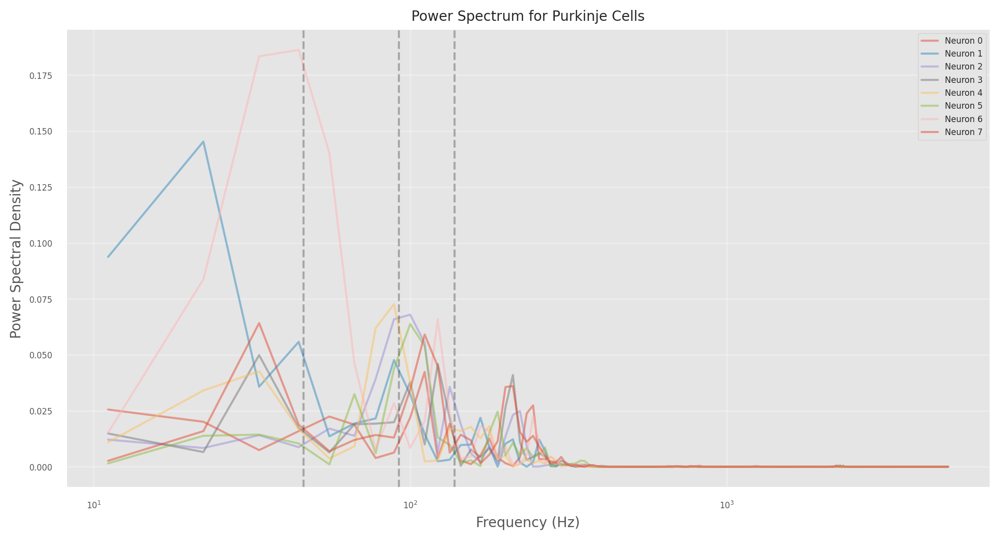

In [102]:
freqs_pc, psd_pc = compute_power_spectrum(rates_per_neuronPC, dt=0.1, nperseg=1024)

print(f"Frequency range: {freqs_pc[0]:.2f} - {freqs_pc[-1]:.2f} Hz")
print(f"PSD shape: {psd_pc.shape}")
print(f"Power spectrum of cell 0:\n{psd_pc[0]}")
plot_power_spectrum(freqs_pc, psd_pc, 'Purkinje Cells', n_neurons_to_plot=8)

In [58]:
print(freqs_pc.shape, psd_pc.shape)

(128,) (68, 128)


In [107]:
np.sum(freqs_pc == 0.0)

np.int64(0)

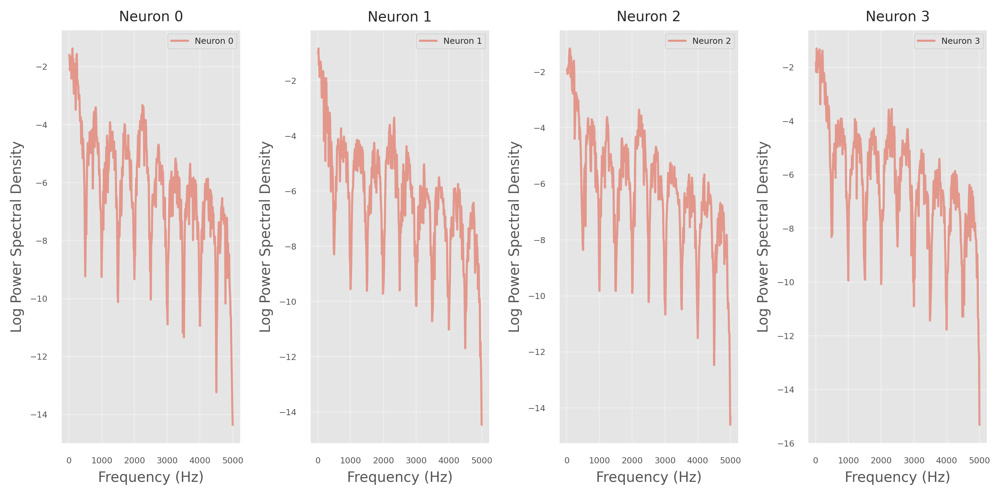

In [111]:
def plot_log_psd(psd_pc, n_plot=4):
    fig , axs = plt.subplots(1, n_plot, figsize=(10, 5), dpi=300)
    for i in range(n_plot):
        axs[i].plot(freqs_pc, np.log10(psd_pc[i]), label=f'Neuron {i}', alpha=0.5)
        axs[i].set_title(f'Neuron {i}')
        axs[i].set_xlabel('Frequency (Hz)')
        axs[i].set_ylabel('Log Power Spectral Density')
        axs[i].grid(True, alpha=0.3)
        axs[i].legend()
    plt.tight_layout()
    plt.show()
plot_log_psd(psd_pc, n_plot=4)

In [104]:
print(psd_pc.shape)

(68, 450)


In [109]:
from fooof import FOOOF

def extract_fooof_features(psd_data, freqs):
    """
    Extract comprehensive FOOOF features for each Purkinje cell
    """
    n_peaks = 3
    all_features = []
    for cell, psd in enumerate(psd_data):
        cell_features = np.zeros(n_peaks * 3 + 2 + 1)
        peak_params = []
        fm = FOOOF(peak_width_limits=[1.6, 20.0])
        fm.fit(freqs, psd)
        print(f"For cell {cell}")
        print(f"error of the model: {fm.error_:.4f}")
        print(f"R^2 of the model: {fm.r_squared_:.4f}\n")

        # aperiodic parameters
        aperiodic_params = fm.get_params('aperiodic_params')
        offset = aperiodic_params[0]
        exponent = aperiodic_params[1]
        
        # peak parameters
        peak_ = fm.get_params('peak_params')
        if len(peak_) > 0:
            arg_peak = peak_[peak_[:, 1].argsort()[::-1]]
            sorted_peaks = arg_peak[:n_peaks, :]

            for i , peak in enumerate(sorted_peaks):
                cell_features[i*3:(i+1)*3] = peak
        
        cell_features[-3] = offset
        cell_features[-2] = exponent
        cell_features[-1] = np.sum(psd)  # total power
        all_features.append(cell_features)

    all_features = np.array(all_features)
    print(f"Extracted FOOOF features shape: {all_features.shape}")
    return all_features

In [110]:
foof_features = extract_fooof_features(psd_pc, freqs_pc)
print(foof_features[0])



FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 1.60 <= 11.11
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

For cell 0
error of the model: 0.8829
R^2 of the model: 0.6976


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 1.60 <= 11.11
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

For cell 1
error of the model: 0.7257
R^2 of the model: 0.7697


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 1.60 <= 11.11
	Lower bounds below frequency-resolution have no effect (effective low

In [124]:
import seaborn as sns

In [143]:
rates_per_neuronPC.shape

(68, 900)

<Axes: ylabel='aperiodic_exponent'>

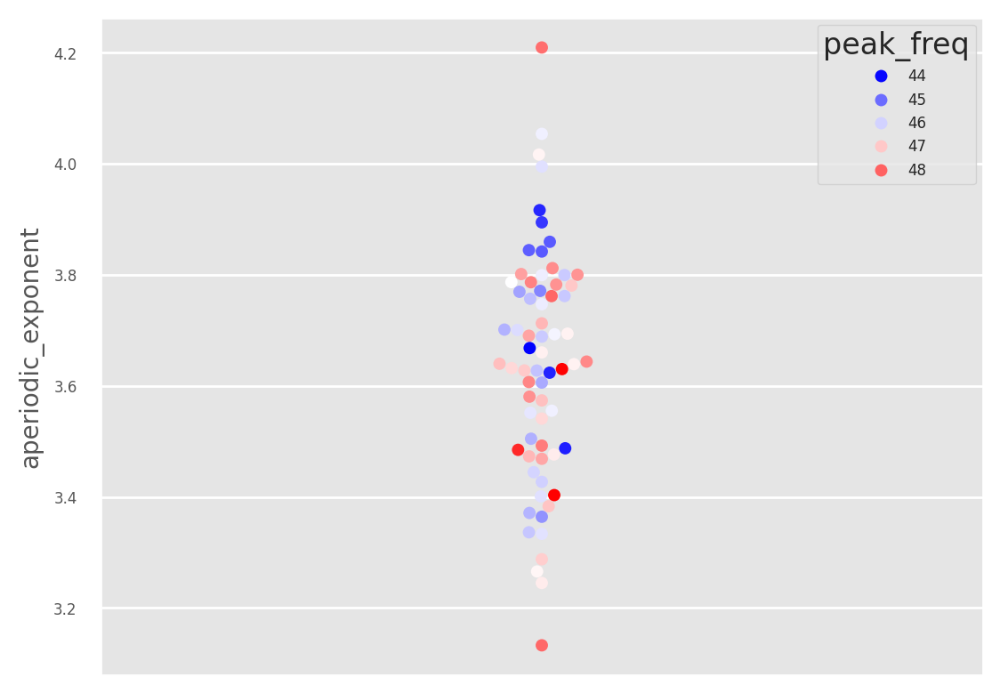

: 

In [ ]:
peak_freqs = np.mean(rates_per_neuronPC, axis=1)
aperiodic_exponents = foof_features[:, -2]
feat = np.array([peak_freqs, aperiodic_exponents]).T

sns.swarmplot(pd.DataFrame(feat, columns=['peak_freq','aperiodic_exponent']), y='aperiodic_exponent', hue='peak_freq', palette='bwr')

In [112]:
def create_combined_feature_matrix(rates_per_neuron, foof_features, neuron_contributions):
    n_neurons = rates_per_neuron.shape[0]
    print(f"PCA contributions shape: {neuron_contributions.shape}")
    print(f"FOOOF features shape: {foof_features.shape}")
    all_features = []

    # neuron correlation features
    for neuron_idx in range(n_neurons):
        neuron_rates = rates_per_neuron[neuron_idx]
        rates_centered = neuron_rates - np.mean(neuron_rates)
        # autocorrelation
        autocorr = np.correlate(rates_centered, rates_centered, mode='full')
        autocorr = autocorr[autocorr.size // 2:][:3]
        autocorr_normalized = (autocorr - np.mean(autocorr)) / (np.std(autocorr) + 1e-8)

        first_diff = np.diff(rates_centered)
        
        temporal_features = [
            np.mean(np.abs(first_diff)),          
            np.std(first_diff)                  
        ]

        rate_stats = [
            np.mean(neuron_rates),                    # Mean firing rate
            np.std(neuron_rates),                     # Firing rate variability
            np.max(neuron_rates),                     # Peak firing rate
            np.min(neuron_rates)                    # Minimum firing rate
        ]

        pop_mean = np.mean(rates_per_neuron, axis=0)
        pop_corr = np.corrcoef(rates_centered, pop_mean)[0, 1]

        # Combine all features into a single vector
        combined_features = np.concatenate([
            neuron_contributions[neuron_idx],  
            foof_features[neuron_idx],          
            autocorr_normalized,               
            temporal_features,                   
            rate_stats,                          
            [pop_corr]                          
        ])
        all_features.append(combined_features)

    all_features = np.array(all_features)

    # indices
    pca_start = 0
    pca_end = neuron_contributions.shape[1]
    foof_start = pca_end
    foof_end = pca_end + foof_features.shape[1]

    autocorr_start = foof_end
    autocorr_end = foof_end + 3
    temporal_start = autocorr_end
    temporal_end = autocorr_end + 2
    firing_rate_start = temporal_end
    firing_rate_end = temporal_end + 4
    prev_end = firing_rate_end
    
    feature_info = {
        "pca": (pca_start, pca_end),
        "foof": (foof_start, foof_end),
        "autocorr": (autocorr_start, autocorr_end),
        "temporal": (temporal_start, temporal_end),
        "firing_rate": (firing_rate_start, firing_rate_end)
    }

    print(f"Combined feature matrix shape: {all_features.shape}")
    return all_features, feature_info

combined_features_pc, feature_infoPC = create_combined_feature_matrix(rates_per_neuronPC, foof_features, neuron_temporal_contributions)
        


PCA contributions shape: (68, 3)
FOOOF features shape: (68, 12)
Combined feature matrix shape: (68, 25)


In [113]:
from sklearn.preprocessing import StandardScaler, RobustScaler
import numpy as np
    

def standardize_feature_matrix(combined_features):
    
    standardized_features = combined_features.copy()
    
    scaler = StandardScaler()
    
    scaled_group = scaler.fit_transform(standardized_features)
    
    print("-> Feature standardization complete")
    return scaled_group


In [114]:
def standardize_robust(combined_features):
    
    combined_features = combined_features.copy()
    for feature in combined_features:
        std = np.std(feature)
        feature = feature / (std + 1e-8)
    print("-> Feature standardization complete")
    
    return combined_features
    

In [115]:
def plot_feature_statistics(features):
    """
    Simple plotting of feature matrix statistics
    """
    # Calculate basic stats
    means = np.mean(features, axis=0)
    stds = np.std(features, axis=0)
    mins = np.min(features, axis=0)
    maxs = np.max(features, axis=0)
    
    # Create plots
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    # Feature means
    axes[0, 0].hist(means, bins=20, alpha=0.7)
    axes[0, 0].set_title('Feature Means')
    axes[0, 0].set_xlabel('Mean Value')
    
    # Feature standard deviations
    axes[0, 1].hist(stds, bins=20, alpha=0.7)
    axes[0, 1].set_title('Feature Standard Deviations')
    axes[0, 1].set_xlabel('Std Dev')
    
    # Feature minimums
    axes[1, 0].hist(mins, bins=20, alpha=0.7)
    axes[1, 0].set_title('Feature Minimums')
    axes[1, 0].set_xlabel('Min Value')
    
    # Feature maximums
    axes[1, 1].hist(maxs, bins=20, alpha=0.7)
    axes[1, 1].set_title('Feature Maximums')
    axes[1, 1].set_xlabel('Max Value')
    
    plt.tight_layout()
    plt.show()


In [68]:
standardize_featuresR = standardize_robust(combined_features_pc)

-> Feature standardization complete


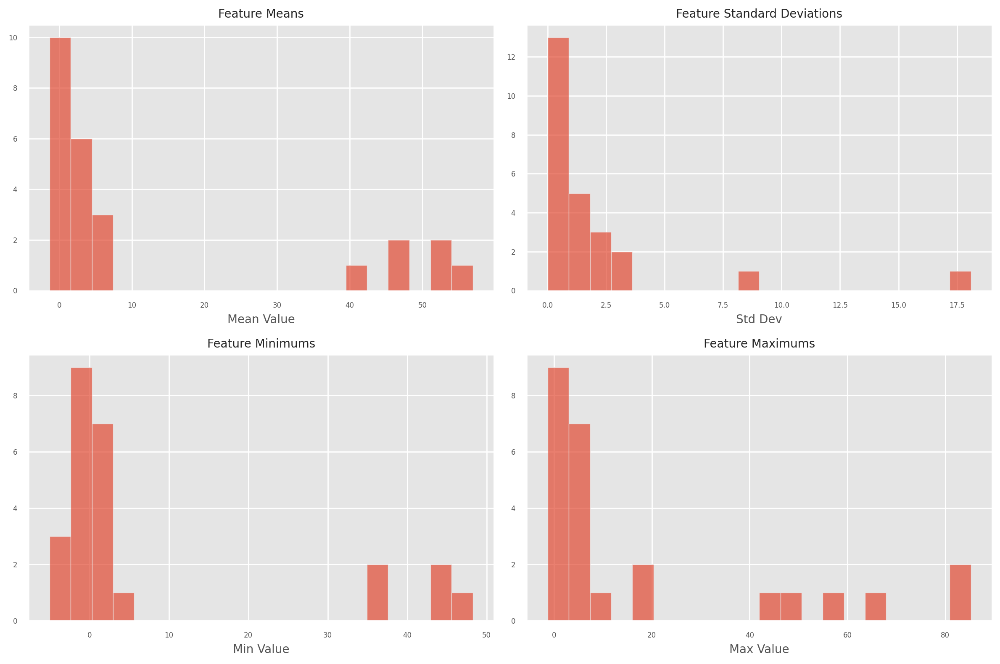

In [116]:
plot_feature_statistics(standardize_featuresR)

In [117]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
import numpy as np
from sklearn.manifold import TSNE


def determine_optimal_clusters(features_scaled, max_k=10, plot=True):
    """
    Determine optimal number of clusters using multiple methods
    """
    
    inertias = []
    silhouette_scores = []
    calinski_scores = []
    davies_bouldin_scores = []
    
    k_range = range(2, max_k + 1)
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(features_scaled)
        
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(features_scaled, clusters))
        calinski_scores.append(calinski_harabasz_score(features_scaled, clusters))
        davies_bouldin_scores.append(davies_bouldin_score(features_scaled, clusters))
    
    # Plot elbow method and silhouette analysis
    if plot:
        fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    
    # Elbow method
        axes[0].plot(k_range, inertias, 'bo-')
        axes[0].set_title('Elbow Method')
        axes[0].set_xlabel('Number of Clusters (k)')
        axes[0].set_ylabel('Inertia')
        
        # Silhouette scores
        axes[1].plot(k_range, silhouette_scores, 'ro-')
        axes[1].set_title('Silhouette Analysis')
        axes[1].set_xlabel('Number of Clusters (k)')
        axes[1].set_ylabel('Silhouette Score')
        
        # Calinski-Harabasz scores
        axes[2].plot(k_range, calinski_scores, 'go-')
        axes[2].set_title('Calinski-Harabasz Index')
        axes[2].set_xlabel('Number of Clusters (k)')
        axes[2].set_ylabel('CH Score')

        axes[3].plot(k_range, davies_bouldin_scores, 'mo-')
        axes[3].set_title('Davies-Bouldin Index')
        axes[3].set_xlabel('Number of Clusters (k)')
        axes[3].set_ylabel('DB Score')
        
        plt.tight_layout()
        plt.show()
    
    return k_range, np.array(silhouette_scores), np.array(calinski_scores), np.array(davies_bouldin_scores)


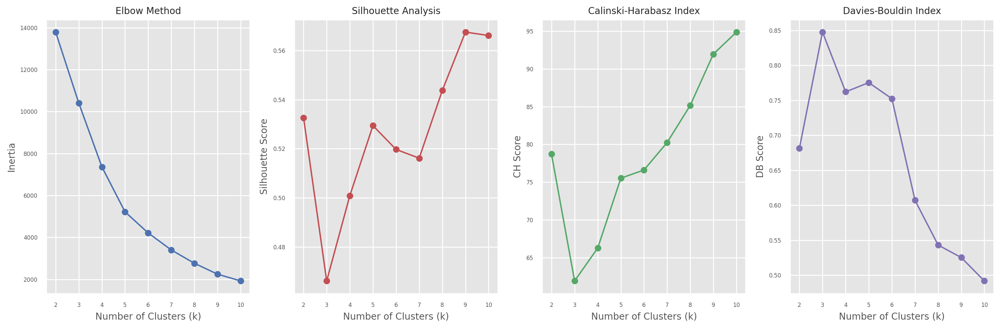

In [118]:
k_range, silhouette_scores, calinski_scores, _ = determine_optimal_clusters(standardize_featuresR, max_k=10)

Starting Neural Clustering Analysis...
Determining optimal number of clusters...


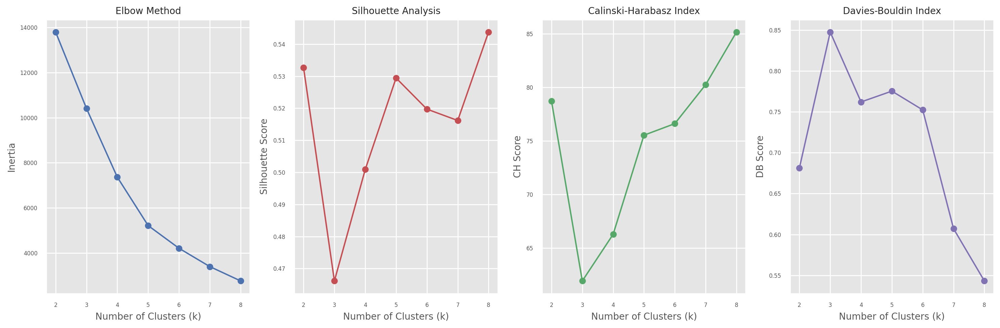

Selecting optimal number of clusters based on silhouette scores...
combined scores: [0.67856236 0.24435709 0.40620061 0.52920112 0.56820619 0.77888101
 0.92395703]
Majority and combined scores agree on 6
   Optimal k selected: 8 (silhouette score: 0.924)
Running single K-means clustering with k=8...
   Final silhouette score: 0.544


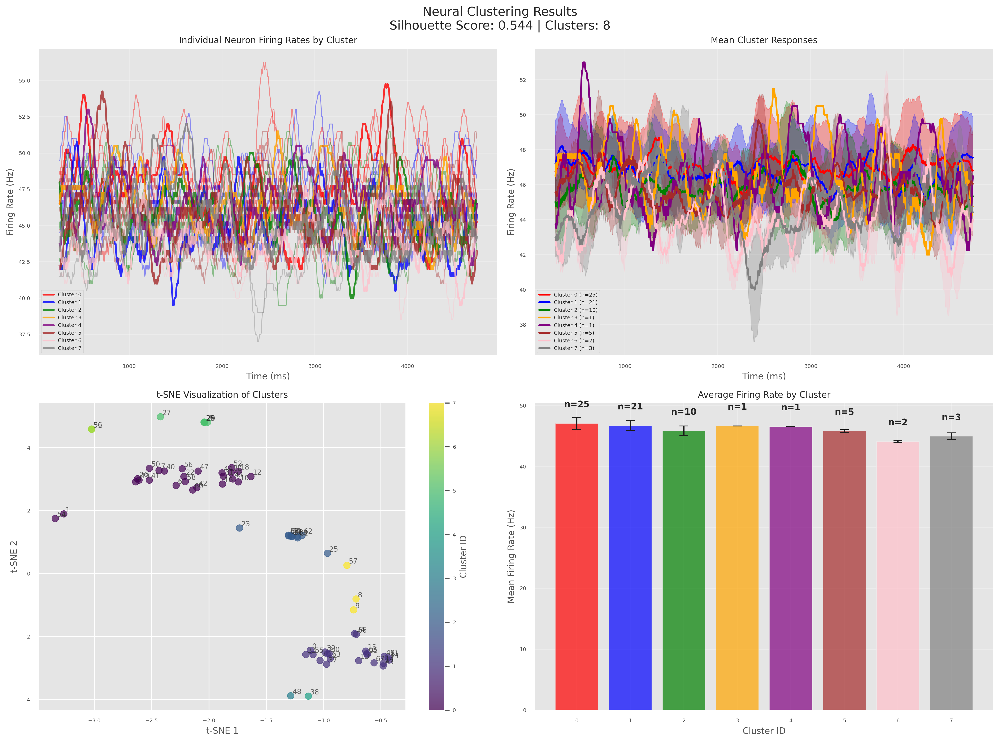


DETAILED CLUSTER ANALYSIS
--------------------------------------------------

Cluster 0: 25 neurons
  Neuron indices: [ 1  3  6  7 10 12 16 18 19 20]...
  Mean firing rate: 47.04 ± 1.00 Hz
  Rate range: 44.87 - 48.98 Hz
  Temporal variability: 2.29 ± 0.22

Cluster 1: 21 neurons
  Neuron indices: [ 0  2  4 11 13 14 15 21 30 32]...
  Mean firing rate: 46.70 ± 0.84 Hz
  Rate range: 44.82 - 47.97 Hz
  Temporal variability: 2.18 ± 0.26

Cluster 2: 10 neurons
  Neuron indices: [17 23 25 39 46 53 59 61 62 64]
  Mean firing rate: 45.82 ± 0.81 Hz
  Rate range: 44.23 - 46.83 Hz
  Temporal variability: 2.07 ± 0.27

Cluster 3: 1 neurons
  Neuron indices: [48]
  Mean firing rate: 46.64 ± 0.00 Hz
  Rate range: 46.64 - 46.64 Hz
  Temporal variability: 1.96 ± 0.00

Cluster 4: 1 neurons
  Neuron indices: [38]
  Mean firing rate: 46.55 ± 0.00 Hz
  Rate range: 46.55 - 46.55 Hz
  Temporal variability: 2.08 ± 0.00

Cluster 5: 5 neurons
  Neuron indices: [ 5 24 27 28 29]
  Mean firing rate: 45.81 ± 0.23 Hz

In [119]:
def neural_clustering(combined_features, rates_per_neuron, times_vector, 
                               max_k=8, plot=True):
    """
    Simplified clustering approach without meta-clustering, with correct firing rate computation
    """
    print("Starting Neural Clustering Analysis...")
    
    # Determine optimal number of clusters
    print("Determining optimal number of clusters...")
    k_range, silhouette_scores, calinski_scores, davies_bouldin_score = determine_optimal_clusters(
        combined_features, max_k=max_k, plot=plot
    )
    
    # Select optimal k based on majority vote from the 3 scores
    print("Selecting optimal number of clusters based on silhouette scores...")
    # Fix silhouette (transform [-1,1] to [0,1])
    silhouette_scoresScaled = (silhouette_scores + 1) / 2

    # Fix calinski-harabasz (min-max normalization)
    calinski_scoresMinMax = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))

    # Fix davies-bouldin (normalize then invert)
    davies_bouldin_normalized = (davies_bouldin_score - np.min(davies_bouldin_score)) / (np.max(davies_bouldin_score) - np.min(davies_bouldin_score))
    davies_bouldin_scoresScaled = 1 - davies_bouldin_normalized

    combined_scores = (silhouette_scoresScaled + calinski_scoresMinMax + davies_bouldin_scoresScaled) / 3
    print(f"combined scores: {combined_scores}")
    combined_decision = np.argmax(combined_scores)

    silhouette_scoresMax = np.argmax(silhouette_scores)
    calinski_scoresMax = np.argmax(calinski_scores)
    davies_bouldin_scoresMax = np.argmin(davies_bouldin_score)

    voting_scores = np.array([silhouette_scoresMax, calinski_scoresMax, davies_bouldin_scoresMax])
    majority_vote = np.bincount(voting_scores).argmax()

    if combined_decision == majority_vote:
        print(f"Majority and combined scores agree on {combined_decision}")
        optimal_k = combined_decision
    else:
        print(f"Majority vote ({majority_vote}) disagrees with combined scores ({combined_decision})")
        optimal_k = combined_decision 

    optimal_k = k_range[np.argmax(combined_scores)]
    print(f"   Optimal k selected: {optimal_k} (silhouette score: {max(combined_scores):.3f})")
    
    print(f"Running single K-means clustering with k={optimal_k}...")
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(combined_features)
  
    silhouette_final = silhouette_score(combined_features, clusters)
    print(f"   Final silhouette score: {silhouette_final:.3f}")
    
    if plot:
        visualize_clusters(clusters, combined_features, rates_per_neuron, 
                                times_vector, silhouette_final)
    
    return clusters, optimal_k, silhouette_final, combined_features


def visualize_clusters(clusters, features_scaled, rates_per_neuron, 
                             times_vector, silhouette_score):
    """
    Visualization with CORRECT firing rate computation using original rates
    """
    unique_clusters, counts = np.unique(clusters, return_counts=True)
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
    
    fig.suptitle(f'Neural Clustering Results\n'
                f'Silhouette Score: {silhouette_score:.3f} | '
                f'Clusters: {len(unique_clusters)}', fontsize=14)
    
    # Individual neuron firing rates by cluster
    ax1 = axes[0, 0]
    ax1.set_title('Individual Neuron Firing Rates by Cluster')
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates, not z-scored!
        color = colors[cluster_id % len(colors)]
        
        # Plot first few neurons from each cluster
        n_neurons_to_plot = min(5, len(cluster_neurons))
        for i in range(n_neurons_to_plot):
            alpha = 0.8 if i == 0 else 0.4
            linewidth = 2 if i == 0 else 1
            label = f'Cluster {cluster_id}' if i == 0 else None
            ax1.plot(times_vector, cluster_neurons[i], 
                    color=color, alpha=alpha, linewidth=linewidth, label=label)
    
    ax1.set_xlabel('Time (ms)')
    ax1.set_ylabel('Firing Rate (Hz)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Mean cluster responses
    ax2 = axes[0, 1]
    ax2.set_title('Mean Cluster Responses')
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates!
        color = colors[cluster_id % len(colors)]
        
        mean_response = np.mean(cluster_neurons, axis=0)
        std_response = np.std(cluster_neurons, axis=0)
        
        ax2.plot(times_vector, mean_response, color=color, linewidth=2,
                label=f'Cluster {cluster_id} (n={np.sum(cluster_mask)})')
        ax2.fill_between(times_vector, mean_response - std_response, 
                        mean_response + std_response, color=color, alpha=0.3)
    
    ax2.set_xlabel('Time (ms)')
    ax2.set_ylabel('Firing Rate (Hz)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # t-SNE visualization (use scaled features for visualization)
    ax3 = axes[1, 0]
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(features_scaled)-1))
    features_tsne = tsne.fit_transform(features_scaled)
    
    scatter = ax3.scatter(features_tsne[:, 0], features_tsne[:, 1], 
                         c=clusters, cmap='viridis', alpha=0.7, s=60)
    
    # Add neuron labels
    for i, (x, y) in enumerate(features_tsne):
        ax3.annotate(f'{i}', (x, y), xytext=(2, 2), 
                   textcoords='offset points', fontsize=8, alpha=0.7)
    
    ax3.set_title('t-SNE Visualization of Clusters')
    ax3.set_xlabel('t-SNE 1')
    ax3.set_ylabel('t-SNE 2')
    plt.colorbar(scatter, ax=ax3, label='Cluster ID')
    
    # Cluster size and firing rate comparison (using original rates!)
    ax4 = axes[1, 1]
    
    mean_rates_per_cluster = []
    std_rates_per_cluster = []
    cluster_sizes = []
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        
        # Mean firing rate across all neurons in cluster
        cluster_mean_rates = np.mean(cluster_neurons, axis=1)  # Mean across time for each neuron
        mean_rates_per_cluster.append(np.mean(cluster_mean_rates))
        std_rates_per_cluster.append(np.std(cluster_mean_rates))
        cluster_sizes.append(np.sum(cluster_mask))
    
    bars = ax4.bar(unique_clusters, mean_rates_per_cluster, 
                   yerr=std_rates_per_cluster,
                   color=[colors[i % len(colors)] for i in unique_clusters],
                   alpha=0.7, capsize=5)
    
    for i, (cluster_id, rate, size) in enumerate(zip(unique_clusters, mean_rates_per_cluster, cluster_sizes)):
        ax4.text(cluster_id, rate + max(mean_rates_per_cluster)*0.05, f'n={size}', 
                ha='center', va='bottom', fontweight='bold')
    
    ax4.set_xlabel('Cluster ID')
    ax4.set_ylabel('Mean Firing Rate (Hz)')
    ax4.set_title('Average Firing Rate by Cluster')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed cluster analysis using ORIGINAL rates
    print(f"\nDETAILED CLUSTER ANALYSIS")
    print("-" * 50)
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_neurons_indices = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]  # Use ORIGINAL rates!
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons_indices[:10]}{'...' if len(cluster_neurons_indices) > 10 else ''}")
        
        # Firing rate statistics using ORIGINAL rates
        mean_rates = np.mean(cluster_rates, axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability using ORIGINAL rates
        temporal_variability = np.std(cluster_rates, axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
    
    # Add cluster validation info
    print(f"\nFINAL CLUSTER VALIDATION")
    print(f"   Silhouette Score: {silhouette_score:.3f}")
    print(f"   Number of Clusters: {len(unique_clusters)}")
    
    return clusters

clusters, optimal_k, silhouette_final, scaled_features = neural_clustering(
    standardize_featuresR, rates_per_neuronPC, times_vectorPC, max_k=8
)


In [73]:
def cohenD(gp1, gp2):
    """
    d = (mean₁ - mean₂) / pooled_standard_deviation
    """
    mean1, mean2 = np.mean(gp1), np.mean(gp2)
    std1, std2 = np.std(gp1), np.std(gp2)
    n1, n2 = len(gp1), len(gp2)
    pooled_std = np.sqrt(((n1-1)*(std1)**2 + (n2-1)*(std2)**2) / (n1+n2-2))
    d = (mean1 - mean2) / pooled_std

    return d

In [74]:
def get_feature_type(feature_idx, feature_info):
    """Map feature index back to feature group name"""
    for group_name, indices in feature_info.items():
        if isinstance(indices, tuple) and indices[0] <= feature_idx < indices[1]:
            return group_name
    return "unknown"

def analyze_features_clusters(clusters, featuresM, featureInfo):
    uniqueClusters = np.unique(clusters)
    cluster_counts = np.bincount(clusters)
    
    valid_clusters = [c for c in uniqueClusters if cluster_counts[c] >= 2]
    print(f"Valid clusters: {valid_clusters}")
    
    all_effects = []
    
    for c1 in valid_clusters:
        for c2 in valid_clusters:
            if c1 >= c2:
                continue
                
            clusterMask = clusters == c1
            clusterMaskOther = clusters == c2
            
            # print(f"\nAnalyzing cluster {c1} ({np.sum(clusterMask)} neurons) vs cluster {c2} ({np.sum(clusterMaskOther)} neurons)")
            
            for featureIdx in range(featuresM.shape[1]):
                currGroup = featuresM[clusterMask, featureIdx]
                otherGroup = featuresM[clusterMaskOther, featureIdx]
                
                effectSize = cohenD(currGroup, otherGroup)
                if not np.isnan(effectSize):
                    # Store: (feature_index, effect_size, cluster_pair, abs_effect_size)
                    all_effects.append((featureIdx, effectSize, (c1, c2), abs(effectSize)))
    
    # Find most distinctive features
    print("\n" + "="*50)
    print("MOST DISTINCTIVE FEATURES OVERALL")
    print("="*50)
    
    # Sort by absolute effect size
    all_effects.sort(key=lambda x: x[3], reverse=True)  # Sort by abs(effect_size)
    
    # Show top 10 most distinctive features
    print("Top 10 most discriminative features across all cluster pairs:")
    for i, (featureIdx, effect, (c1, c2), abs_effect) in enumerate(all_effects[:10]):
        direction = f"C{c1} higher" if effect > 0 else f"C{c2} higher"
        feature_type = get_feature_type(featureIdx, featureInfo)
        print(f"{i+1:2d}. Feature {featureIdx:2d} of type {feature_type}: d={effect:6.3f} (|d|={abs_effect:.3f}) - {direction} in C{c1} vs C{c2}")
    
    return all_effects

analyze_features_clusters(clusters, standardize_featuresR, feature_infoPC)

Valid clusters: [np.int32(0), np.int32(1), np.int32(2), np.int32(5), np.int32(6), np.int32(7)]

MOST DISTINCTIVE FEATURES OVERALL
Top 10 most discriminative features across all cluster pairs:
 1. Feature  9 of type foof: d=-328.015 (|d|=328.015) - C5 higher in C1 vs C5
 2. Feature  9 of type foof: d=-266.027 (|d|=266.027) - C6 higher in C1 vs C6
 3. Feature  9 of type foof: d=77.166 (|d|=77.166) - C5 higher in C5 vs C6
 4. Feature  9 of type foof: d=-57.131 (|d|=57.131) - C5 higher in C2 vs C5
 5. Feature  9 of type foof: d=-51.988 (|d|=51.988) - C2 higher in C1 vs C2
 6. Feature  9 of type foof: d=-33.894 (|d|=33.894) - C6 higher in C2 vs C6
 7. Feature  9 of type foof: d=12.214 (|d|=12.214) - C0 higher in C0 vs C1
 8. Feature  6 of type foof: d=-12.118 (|d|=12.118) - C7 higher in C6 vs C7
 9. Feature  6 of type foof: d=-8.812 (|d|=8.812) - C7 higher in C0 vs C7
10. Feature  9 of type foof: d= 8.532 (|d|=8.532) - C5 higher in C5 vs C7


[(9,
  np.float64(-328.01486818299395),
  (np.int32(1), np.int32(5)),
  np.float64(328.01486818299395)),
 (9,
  np.float64(-266.02717773432744),
  (np.int32(1), np.int32(6)),
  np.float64(266.02717773432744)),
 (9,
  np.float64(77.1655726822051),
  (np.int32(5), np.int32(6)),
  np.float64(77.1655726822051)),
 (9,
  np.float64(-57.13144558913773),
  (np.int32(2), np.int32(5)),
  np.float64(57.13144558913773)),
 (9,
  np.float64(-51.98808298624895),
  (np.int32(1), np.int32(2)),
  np.float64(51.98808298624895)),
 (9,
  np.float64(-33.893617291926994),
  (np.int32(2), np.int32(6)),
  np.float64(33.893617291926994)),
 (9,
  np.float64(12.213958534681051),
  (np.int32(0), np.int32(1)),
  np.float64(12.213958534681051)),
 (6,
  np.float64(-12.11789325125922),
  (np.int32(6), np.int32(7)),
  np.float64(12.11789325125922)),
 (6,
  np.float64(-8.812101283762773),
  (np.int32(0), np.int32(7)),
  np.float64(8.812101283762773)),
 (9,
  np.float64(8.53208968428603),
  (np.int32(5), np.int32(7)),
  

In [75]:
import shap
def shap_values(rates_per_neuron, clusters, featuresM, featureInfo):
    pass

In [76]:
def create_raw_temporal_features(rates_per_neuron, fooof_features=None, foof=False):
    """
    Simple and correct approach
    """
    # Center temporal data
    centered_rates = rates_per_neuron - np.mean(rates_per_neuron, axis=1, keepdims=True)
    if foof and fooof_features is not None:
        print("Using FOOOF features for spectral analysis...")
        combined_features = np.concatenate([
            centered_rates,    # (68, 900) temporal features
            fooof_features  # (68, 13) spectral features 
        ], axis=1)
    else:  
        combined_features = centered_rates
        
    print(f"Combined features shape: {combined_features.shape}")  # Should be (68, 913)
    
    return combined_features


In [77]:
raw_features = create_raw_temporal_features(
    rates_per_neuronPC, 
    foof=False
)

Combined features shape: (68, 900)


In [78]:
standardize_raw_features = standardize_feature_matrix(raw_features.T)
print(f"Standardized raw features shape: {standardize_raw_features.shape}")  # Should be (68, 913)
print(f"Minimum value: {np.min(standardize_raw_features)} vs {np.min(raw_features)}")
print(f"Maximum value: {np.max(standardize_raw_features)} vs {np.max(raw_features)}")

-> Feature standardization complete
Standardized raw features shape: (900, 68)
Minimum value: -3.3216034820346545 vs -7.81611111111112
Maximum value: 3.7011240856834684 vs 8.679999999999993


In [79]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import geotorch

features_tensor_raw = torch.FloatTensor(standardize_raw_features)
print(f"Raw features tensor shape: {features_tensor_raw.shape}")  # Should be (
dataset_raw = TensorDataset(features_tensor_raw, features_tensor_raw)
dataloader_raw = DataLoader(dataset_raw, batch_size=16, shuffle=True, drop_last=False)

Raw features tensor shape: torch.Size([900, 68])


In [80]:
class Encoder(nn.Module):
    def __init__(self, input_size, dropout, latent_size=32):
        super(Encoder, self).__init__()
        self.input_size = input_size
        self.latent_size = latent_size
        self.dropout = dropout
        
        self.main_layer = nn.Linear(input_size, latent_size)
        self.dropout_layer = nn.Dropout(dropout)
        self.activation = nn.Tanh()

    def forward(self, x):
        x = self.main_layer(x)
        x = self.dropout_layer(x)
        x = self.activation(x)
        return x


class Decoder(nn.Module):
    def __init__(self, latent_size, output_size, dropout=0.1):
        super(Decoder, self).__init__()
        self.latent_size = latent_size
        self.output_size = output_size
        
        self.main_layer = nn.Linear(latent_size, output_size)
    
    def forward(self, x):
        x = self.main_layer(x)
        return x 

class SparseAutoencoder(nn.Module):
    def __init__(self, input_size, latent_size=8, dropout=0.1, 
                 lr=0.0001, weight_decay=1e-5, lambda_sparse=None, lambda_orthogonal=None,
                 b_init=None, U_init=None, V_init=None):
        super(SparseAutoencoder, self).__init__()
        self.encoder = Encoder(input_size, dropout, latent_size)
        self.decoder = Decoder(latent_size, input_size, dropout)

        if U_init is not None:
            self.encoder.main_layer.weight = nn.Parameter(
                torch.tensor(U_init.T, dtype=torch.float32)
            )
            
        if V_init is not None:
            self.decoder.main_layer.weight = nn.Parameter(
                torch.tensor(V_init.T, dtype=torch.float32)
            )
            
        if b_init is not None:
            self.encoder.main_layer.bias = nn.Parameter(
                torch.tensor(b_init, dtype=torch.float32)
    )
        try:
            geotorch.orthogonal(self.decoder.main_layer, "weight")
        except KeyError:
            print("Orthogonal constraint already exists, skipping...")
        
        self.lambda_sparse = lambda_sparse
        self.optim = optim.Adam(self.parameters(), lr=lr, weight_decay=weight_decay)
    
    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent
    
    def encode(self, x):
        return self.encoder(x)
    
    def decode(self, latent):
        return self.decoder(latent)
    
    def loss_orth_sparse(self, output, target, latent):
        recon_loss = torch.mean((output - target)**2)
        
        loss_sparse = self.lambda_sparse * torch.mean(torch.abs(latent))
        
        total_loss = recon_loss + loss_sparse 
        
        losses = {
            'reconstruction_loss': recon_loss.item(),
            'sparsity_loss': loss_sparse.item(),
            'total_loss': total_loss.item()
        }
        
        return total_loss, losses


In [81]:
class SetModel():
    def __init__(self, X, latent_size=32, dropout=0.1, 
                 lr=0.001, init_weight=None, lambda_sparse=None): 
        
        self.input_size = X.shape
        self.latent_size = latent_size
        self.dropout = dropout
        self.lr = lr
        self.init_weight = init_weight

        original_lambda_sparse = lambda_sparse

        if self.init_weight is None:
            wpca = PCA(n_components=latent_size).fit(X)
            self.U_pca, self.V_pca = wpca.components_.T, wpca.components_
            print(f"Shape of U_pca: {self.U_pca.shape}, V_pca: {self.V_pca.shape}")
            self.pca_latent = wpca.transform(X)
            self.b_est = np.mean(self.pca_latent, axis=0)
            self.wpca = wpca

        self.pca_recon = self.wpca.inverse_transform(self.pca_latent)
        
        if original_lambda_sparse is None:
            self.pca_recon = self.wpca.inverse_transform(self.pca_latent)
            self.lambda_sparse = .01*np.sum((X-self.pca_recon)**2)/np.sum(np.abs(self.pca_latent))
            print('Using lam_sparse= ', self.lambda_sparse)
        else:
            self.lambda_sparse = original_lambda_sparse

        self.model = SparseAutoencoder(
            input_size=self.input_size[1], 
            latent_size=self.latent_size,
            dropout=self.dropout,
            lr=self.lr,
            weight_decay=1e-5,
            lambda_sparse=self.lambda_sparse,
            b_init=self.b_est,  
            U_init=self.U_pca,  
            V_init=self.V_pca  
        )


In [82]:
def train_autoencoder(model, dataloader, device, n_epochs=100):
    model.to(device)
    model.train()
    train_losses = []
    
    for epoch in range(n_epochs):
        epoch_losses = {'total': 0, 'recon': 0, 'sparse': 0}
        
        for batch_data, _ in dataloader:
            # print(f"Batch data shape: {batch_data.shape}")
            batch_data = batch_data.to(device)
            
            model.optim.zero_grad()
            reconstructed, latent = model(batch_data)
            
            total_loss, losses = model.loss_orth_sparse(
                reconstructed, 
                batch_data, 
                latent
            )
            
            total_loss.backward()
            model.optim.step()
            
            epoch_losses['total'] += total_loss.item()
            epoch_losses['recon'] += losses['reconstruction_loss']
            epoch_losses['sparse'] += losses['sparsity_loss']
        
        # Average losses
        for key in epoch_losses:
            epoch_losses[key] /= len(dataloader)
        
        train_losses.append(epoch_losses)
        
        if (epoch + 1) % 20 == 0:
            print(f"Epoch [{epoch+1}/{n_epochs}] | "
                  f"Total: {epoch_losses['total']:.6f} | "
                  f"Recon: {epoch_losses['recon']:.6f} | "
                  f"Sparse: {epoch_losses['sparse']:.6f}")
    
    return model, train_losses

In [83]:
standardize_raw_features.shape

(900, 68)

In [84]:
input_size = standardize_raw_features.shape[1]
print(f"Input size for SparseAutoencoder: {input_size}")

modelAE_sparse = SetModel(
    X=standardize_raw_features,
    latent_size=16,
    dropout=0.1  
)


print(modelAE_sparse.model)

Input size for SparseAutoencoder: 68
Shape of U_pca: (68, 16), V_pca: (16, 68)
Using lam_sparse=  0.009013173263572413
SparseAutoencoder(
  (encoder): Encoder(
    (main_layer): Linear(in_features=68, out_features=16, bias=True)
    (dropout_layer): Dropout(p=0.1, inplace=False)
    (activation): Tanh()
  )
  (decoder): Decoder(
    (main_layer): ParametrizedLinear(
      in_features=16, out_features=68, bias=True
      (parametrizations): ModuleDict(
        (weight): ParametrizationList(
          (0): Stiefel(n=68, k=16, triv=linalg_matrix_exp)
        )
      )
    )
  )
)


In [85]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_sparseTrained, train_losses_sparse = train_autoencoder(
    modelAE_sparse.model, 
    dataloader_raw, 
    device  
)

Epoch [20/100] | Total: 0.566445 | Recon: 0.559471 | Sparse: 0.006974


KeyboardInterrupt: 

In [ ]:
def get_latent_features(model, standardized_features):
    """
    Extract latent representations for clustering
    """
    model.eval()
    device = next(model.parameters()).device
    
    with torch.no_grad():
        features_tensor = torch.FloatTensor(standardized_features).to(device)
        latent_features = model.encode(features_tensor)
    
    return latent_features.cpu().numpy()


In [ ]:
sca_latent_features = get_latent_features(model_sparseTrained, standardize_raw_features)

print(f"SCA latent features shape: {sca_latent_features.shape}")  # Should be (68, 32)


SCA latent features shape: (900, 8)


In [ ]:
def temporal_clustering(latent_representations, neural_data, times_vector, 
                       max_k=8, plot=True):
    """
    Clustering approach for temporal states using autoencoder latent space
    
    Args:
        latent_representations: (900, 8) - autoencoder latent space
        neural_data: (900, 68) - original neural data for visualization
        times_vector: time stamps for each time point
    """
    print("Starting Temporal Clustering Analysis...")
    
    print("Determining optimal number of temporal clusters...")
    k_range, silhouette_scores, calinski_scores, davies_bouldin_scores = determine_optimal_clusters(
        latent_representations, max_k=max_k, plot=plot
    )
    
    silhouette_scoresScaled = (silhouette_scores + 1) / 2
    calinski_scoresMinMax = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))
    davies_bouldin_normalized = (davies_bouldin_scores - np.min(davies_bouldin_scores)) / (np.max(davies_bouldin_scores) - np.min(davies_bouldin_scores))
    davies_bouldin_scoresScaled = 1 - davies_bouldin_normalized

    combined_scores = (silhouette_scoresScaled + calinski_scoresMinMax + davies_bouldin_scoresScaled) / 3
    optimal_k = k_range[np.argmax(combined_scores)]
    print(f"   Optimal k selected: {optimal_k}")
    
    print(f"Running K-means clustering on latent space with k={optimal_k}...")
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    temporal_clusters = kmeans.fit_predict(latent_representations)
  
    silhouette_final = silhouette_score(latent_representations, temporal_clusters)
    print(f"   Final silhouette score: {silhouette_final:.3f}")
    
    if plot:
        visualize_temporal_clusters(temporal_clusters, latent_representations, 
                                  neural_data, times_vector, silhouette_final)
    
    return temporal_clusters, optimal_k, silhouette_final, latent_representations

def visualize_temporal_clusters(clusters, latent_features, neural_data, 
                               times_vector, silhouette_score):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    print("Computing t-SNE...")
    from sklearn.manifold import TSNE
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    latent_2d = tsne.fit_transform(latent_features)
    
    scatter = ax1.scatter(latent_2d[:, 0], latent_2d[:, 1], 
                         c=clusters, cmap='viridis', alpha=0.7, s=30)
    ax1.set_title('t-SNE: Latent Space Clusters')
    ax1.set_xlabel('t-SNE 1')
    ax1.set_ylabel('t-SNE 2')
    plt.colorbar(scatter, ax=ax1, label='Brain State')
    
    unique_clusters = np.unique(clusters)
    colors = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
    
    for i, cluster_id in enumerate(unique_clusters):
        cluster_mask = clusters == cluster_id
        cluster_times = times_vector[cluster_mask]
        
        ax2.scatter(cluster_times, [cluster_id] * len(cluster_times), 
                   c=[colors[i]], alpha=0.8, s=20, 
                   label=f'State {cluster_id}')
    
    ax2.set_xlabel('Time (ms)')
    ax2.set_ylabel('Brain State')
    ax2.set_title('Brain States Over Time')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

    print(f"\nCLUSTERING SUMMARY:")
    print(f"Number of brain states: {len(unique_clusters)}")
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        duration = np.sum(cluster_mask)
        percentage = 100 * duration / len(clusters)
        print(f"  State {cluster_id}: {duration} time points ({percentage:.1f}%)")


Starting Temporal Clustering Analysis...
Determining optimal number of temporal clusters...


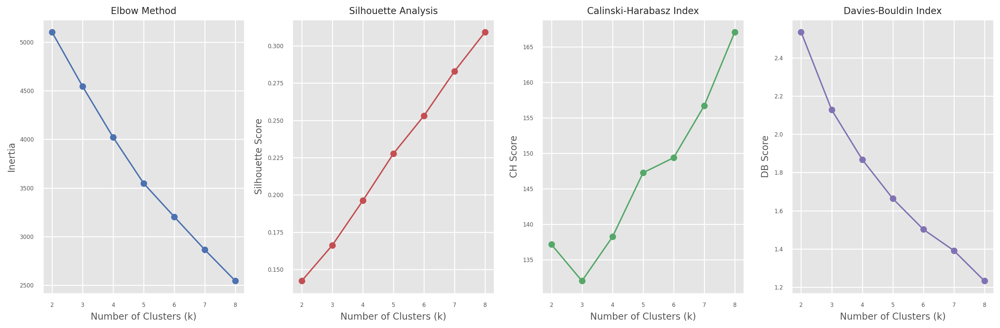

   Optimal k selected: 8
Running K-means clustering on latent space with k=8...
   Final silhouette score: 0.309
Computing t-SNE...


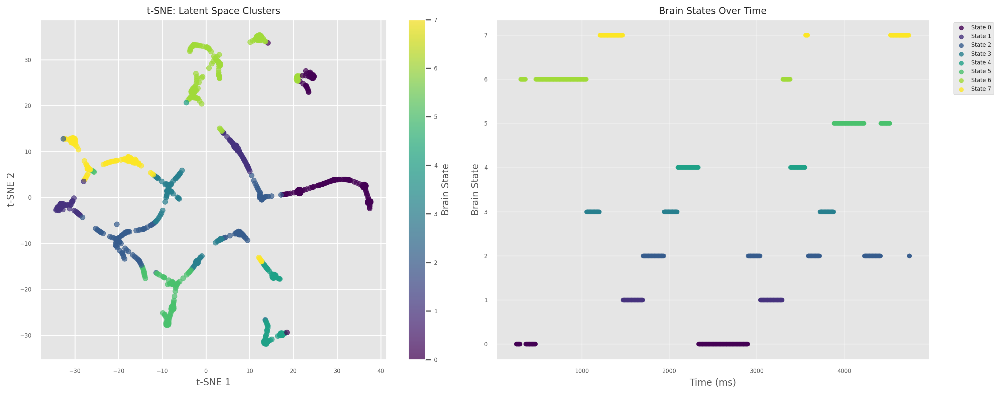


CLUSTERING SUMMARY:
Number of brain states: 8
  State 0: 146 time points (16.2%)
  State 1: 97 time points (10.8%)
  State 2: 142 time points (15.8%)
  State 3: 93 time points (10.3%)
  State 4: 82 time points (9.1%)
  State 5: 92 time points (10.2%)
  State 6: 146 time points (16.2%)
  State 7: 102 time points (11.3%)


In [ ]:
sca_clusters, sca_optimal_k, sca_silhouette, _ = temporal_clustering(
    sca_latent_features,  
    rates_per_neuronPC,    
    times_vectorPC, 
    max_k=8
)


Latent Space Interpretability Analysis

Most discriminative latent dimensions:
   Dimension 2: F-score = 212.60, p-value = 0.0000
   Dimension 1: F-score = 208.75, p-value = 0.0000
   Dimension 6: F-score = 172.41, p-value = 0.0000
   Dimension 5: F-score = 161.20, p-value = 0.0000
   Dimension 4: F-score = 152.13, p-value = 0.0000


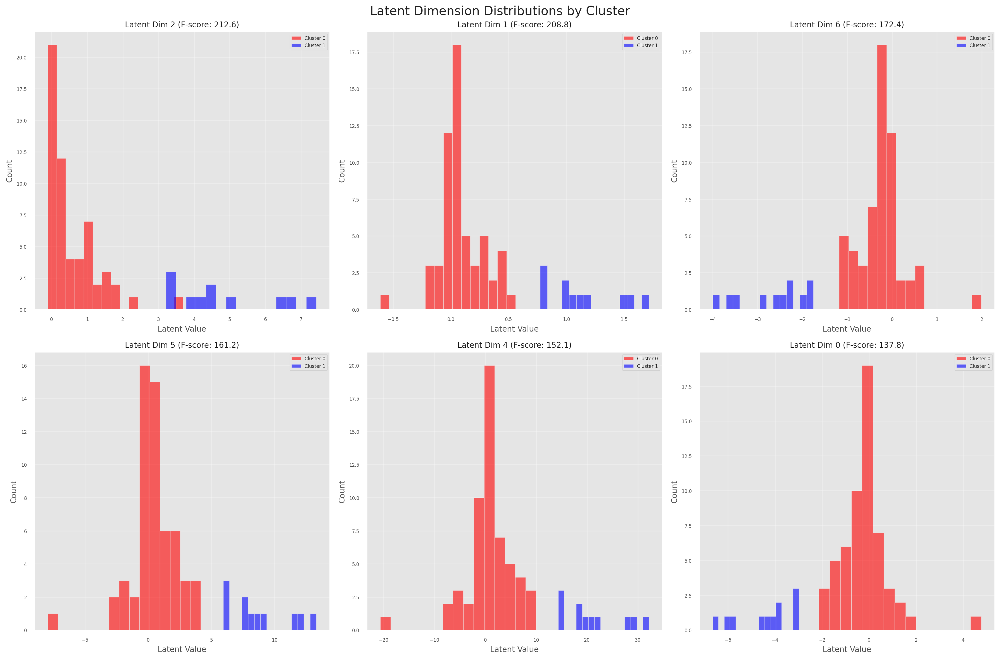


Cluster centroids in latent space:

Cluster 0 (n=57):
  Top 3 latent dimensions: [2 1 6]
    Dim 2: 0.543
    Dim 1: 0.087
    Dim 6: -0.228

Cluster 1 (n=11):
  Top 3 latent dimensions: [2 1 6]
    Dim 2: 4.809
    Dim 1: 1.131
    Dim 6: -2.650


In [ ]:
from sklearn.feature_selection import f_classif
from scipy.stats import pearsonr

def interpret_latent_dimensions(model, original_features, clusters, device):
    """
    Analyze what each latent dimension represents
    """
    
    print("Latent Space Interpretability Analysis")
    
    # Get latent features
    latent_features = get_latent_features(model, original_features)
    
    # 1. Find most discriminative latent dimensions
    f_scores, p_values = f_classif(latent_features, clusters)
    discriminative_dims = np.argsort(f_scores)[::-1]
    
    print(f"\nMost discriminative latent dimensions:")
    for i, dim in enumerate(discriminative_dims[:5]):
        print(f"   Dimension {dim}: F-score = {f_scores[dim]:.2f}, p-value = {p_values[dim]:.4f}")
    
    # 2. Latent dimension clustering patterns
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    colors = ['red', 'blue', 'green', 'orange']
    
    for i, dim in enumerate(discriminative_dims[:6]):
        ax = axes[i]
        
        for cluster_id in np.unique(clusters):
            cluster_mask = clusters == cluster_id
            cluster_latent = latent_features[cluster_mask, dim]
            
            ax.hist(cluster_latent, bins=15, alpha=0.6, 
                   color=colors[cluster_id % len(colors)],
                   label=f'Cluster {cluster_id}')
        
        ax.set_title(f'Latent Dim {dim} (F-score: {f_scores[dim]:.1f})')
        ax.set_xlabel('Latent Value')
        ax.set_ylabel('Count')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    plt.suptitle('Latent Dimension Distributions by Cluster', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # 3. Cluster centroids in latent space
    print(f"\nCluster centroids in latent space:")
    for cluster_id in np.unique(clusters):
        cluster_mask = clusters == cluster_id
        cluster_latent = latent_features[cluster_mask]
        centroid = np.mean(cluster_latent, axis=0)
        
        print(f"\nCluster {cluster_id} (n={np.sum(cluster_mask)}):")
        print(f"  Top 3 latent dimensions: {discriminative_dims[:3]}")
        for dim in discriminative_dims[:3]:
            print(f"    Dim {dim}: {centroid[dim]:.3f}")
    
    return discriminative_dims, f_scores, latent_features

discriminative_dims, f_scores, latent_analysis = interpret_latent_dimensions(
    model_raw_trained, standardize_raw_features, clusters_latent, device
)


In [ ]:
def map_clusters_to_features(clusters, rates_per_neuron, fooof_features, 
                           discriminative_dims, latent_features):
    """
    Map latent space clusters back to biological interpretations
    """
    print("Interpretation of Latent Clusters")
    
    for cluster_id in np.unique(clusters):
        cluster_mask = clusters == cluster_id
        n_neurons = np.sum(cluster_mask)
        
        print(f"\nCluster {cluster_id} ({n_neurons} neurons):")
        
   
        cluster_rates = rates_per_neuron[cluster_mask]
        mean_firing_rate = np.mean(cluster_rates)
        temporal_variability = np.mean(np.std(cluster_rates, axis=1))
        
        if fooof_features is not None:
            cluster_fooof = fooof_features[cluster_mask]
            mean_spectral = np.mean(cluster_fooof, axis=0)
            std_spectral = np.std(cluster_fooof, axis=0)
            
            print(f"SPECTRAL CHARACTERISTICS:")
            
            print(f"Aperiodic offset: {mean_spectral[-3]:.3f} ± {std_spectral[-3]:.3f}")
            print(f"Aperiodic exponent: {mean_spectral[-2]:.3f} ± {std_spectral[-2]:.3f}")
            print(f"Total power: {mean_spectral[-1]:.3f} ± {std_spectral[-1]:.3f}")

            if len(mean_spectral) > 2:
                print(f"Peak frequencies: {mean_spectral[0::3]}")  
                print(f"Peak powers: {mean_spectral[2::3]}")      
                print(f"Peak bandwidths: {mean_spectral[3::3]}")  
            
        
        cluster_latent = latent_features[cluster_mask]
        
        print(f"   Firing rate: {mean_firing_rate:.2f} Hz")
        print(f"   Temporal variability: {temporal_variability:.3f}")
        print(f"   Latent space centroid norm: {np.linalg.norm(np.mean(cluster_latent, axis=0)):.3f}")
        
        cluster_centroid = np.mean(cluster_latent, axis=0)
        top_dims = discriminative_dims[:3]
        print(f"Key latent dimensions: {top_dims}")
        for dim in top_dims:
            print(f"Dim {dim}: {cluster_centroid[dim]:.3f}")

map_clusters_to_features(clusters_latent, rates_per_neuronPC, foof_features, 
                       discriminative_dims, latent_analysis)


Interpretation of Latent Clusters

Cluster 1 (11 neurons):
SPECTRAL CHARACTERISTICS:
Aperiodic offset: 0.779 ± 0.879
Aperiodic exponent: 3.626 ± 0.583
Peak frequencies: [29.08649623 31.02030205  8.17689169 13.93558139]
Peak powers: [2.80240486 2.50609505 0.71960642 6.40757969]
Peak bandwidths: [4.09438341 3.18707055 0.86172397]
Model R²: 13.936 ± 3.934
Model error: 6.408 ± 2.866
   Firing rate: 45.56 Hz
   Temporal variability: 2.315
   Latent space centroid norm: 25.161
Key latent dimensions: [2 1 6]
Dim 2: 4.809
Dim 1: 1.131
Dim 6: -2.650

Cluster 2 (57 neurons):
SPECTRAL CHARACTERISTICS:
Aperiodic offset: 0.408 ± 1.044
Aperiodic exponent: 3.460 ± 0.755
Peak frequencies: [18.23787808 34.94580344 29.50158525 11.73429362]
Peak powers: [2.49068399 2.67335257 2.41574291 9.25460282]
Peak bandwidths: [4.22335738 3.75058268 2.85379182]
Model R²: 11.734 ± 3.212
Model error: 9.255 ± 3.361
   Firing rate: 46.65 Hz
   Temporal variability: 2.180
   Latent space centroid norm: 1.149
Key latent d

In [ ]:
def compare_fooof_across_clusters(clusters, fooof_features):
    """
    Detailed comparison of FOOOF features across clusters using F-test only
    """    
    print("\nDetailed FOOOF Feature Comparison Across Clusters")
    
    unique_clusters = np.unique(clusters)
    n_features = fooof_features.shape[1]
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    feature_names = ['Offset', 'Exponent', 'Peak1_Freq', 'Peak1_Power', 'Peak1_BW', 'Total_Power']
    feature_indices = [0, 1, 2, 3, 4, 11]
    
    for i, (feature_name, feature_idx) in enumerate(zip(feature_names, feature_indices)):
        if i >= len(axes):
            break
            
        ax = axes[i]
        
        cluster_data = []
        cluster_labels = []
        
        for cluster_id in unique_clusters:
            cluster_mask = clusters == cluster_id
            if feature_idx < n_features:
                cluster_feature_values = fooof_features[cluster_mask, feature_idx]
                cluster_data.append(cluster_feature_values)
                cluster_labels.append(f'Cluster {cluster_id}')
        
        if cluster_data:
            box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
            
            for patch, color in zip(box_plot['boxes'], colors[:len(cluster_data)]):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)
        
        ax.set_title(f'{feature_name} by Cluster')
        ax.set_ylabel(feature_name)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    from scipy.stats import f_oneway
    
    print(f"\nStatistical Comparison of FOOOF Features (F-test):")
    print("-" * 60)
    
    for i, (feature_name, feature_idx) in enumerate(zip(feature_names, feature_indices)):
        if feature_idx >= n_features:
            continue
            
        cluster_groups = []
        for cluster_id in unique_clusters:
            cluster_mask = clusters == cluster_id
            cluster_feature_values = fooof_features[cluster_mask, feature_idx]
            cluster_groups.append(cluster_feature_values)
        
        if len(cluster_groups) > 1:
            f_stat, p_value = f_oneway(*cluster_groups)
            
            print(f"{feature_name}:")
            print(f"  F-statistic: {f_stat:.3f}")
            print(f"  p-value: {p_value:.4f}")
            
            if p_value < 0.001:
                significance = "Highly significant (p < 0.001)"
            elif p_value < 0.01:
                significance = "Very significant (p < 0.01)"
            elif p_value < 0.05:
                significance = "Significant (p < 0.05)"
            else:
                significance = "Not significant (p ≥ 0.05)"
            
            print(f"  {significance}")
            print()
def identify_cluster_spectral_signatures(clusters, fooof_features):
    """
    Identify and interpret spectral signatures for each cluster
    """
    print("\nCluster Spectral Signatures")
    print("=" * 60)
    
    unique_clusters = np.unique(clusters)
    
    feature_names = [
        'Offset', 'Exponent', 'Peak1_Freq', 'Peak1_Power', 'Peak1_BW',
        'Peak2_Freq', 'Peak2_Power', 'Peak2_BW', 'Peak3_Freq', 'Peak3_Power', 'Peak3_BW',
        'Total_Power', 'Relative_Periodic_Power'
    ]
    
    for cluster_id in unique_clusters:
        cluster_mask = clusters == cluster_id
        cluster_fooof = fooof_features[cluster_mask]
        n_neurons = np.sum(cluster_mask)
        
        print(f"\nCluster {cluster_id} Spectral Signature ({n_neurons} neurons):")
        
        offset_mean = np.mean(cluster_fooof[:, 0])
        offset_std = np.std(cluster_fooof[:, 0])
        exponent_mean = np.mean(cluster_fooof[:, 1])
        exponent_std = np.std(cluster_fooof[:, 1])
        
        print(f"Aperiodic Background:")
        print(f"Offset (baseline power): {offset_mean:.3f} ± {offset_std:.3f}")
        print(f"Exponent (1/f slope): {exponent_mean:.3f} ± {exponent_std:.3f}")
        
        if exponent_mean > 2.5:
            exponent_interpretation = "Shallow 1/f slope - inhibition-dominated"
        elif exponent_mean > 1.5:
            exponent_interpretation = "Moderate 1/f slope - balanced E/I"
        else:
            exponent_interpretation = "Steep 1/f slope - excitation-dominated"
        
        print(f"Interpretation: {exponent_interpretation}")
        

        peak_info = []

        for peak_idx in range(3): 
            freq_idx = 2 + peak_idx * 3
            power_idx = 3 + peak_idx * 3
            bw_idx = 4 + peak_idx * 3
            
            if freq_idx < fooof_features.shape[1]:
                has_peak = cluster_fooof[:, freq_idx] > 0
                
                if np.any(has_peak):
                    peak_neurons = cluster_fooof[has_peak]
                    freq_mean = np.mean(peak_neurons[:, freq_idx])
                    power_mean = np.mean(peak_neurons[:, power_idx])
                    bw_mean = np.mean(peak_neurons[:, bw_idx])
                    
                    peak_info.append({
                        'peak_num': peak_idx + 1,
                        'frequency': freq_mean,
                        'power': power_mean,
                        'bandwidth': bw_mean,
                        'n_neurons': len(peak_neurons)
                    })
        
        if peak_info:
            print(f"Oscillatory Peaks ({len(peak_info)} detected):")
            for peak in peak_info:
                print(f"     Peak {peak['peak_num']}: {peak['frequency']:.1f} Hz, "
                      f"Power: {peak['power']:.3f}, BW: {peak['bandwidth']:.3f}")
        else:
            print("Oscillatory Peaks: None detected")
        
        if offset_mean > 0.3:
            baseline_level = "High baseline power"
        elif offset_mean > -0.3:
            baseline_level = "Medium baseline power"
        else:
            baseline_level = "Low baseline power"
        
        print(f"Overall signature: {baseline_level}, {exponent_interpretation}")


Detailed FOOOF Feature Comparison Across Clusters


/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' 

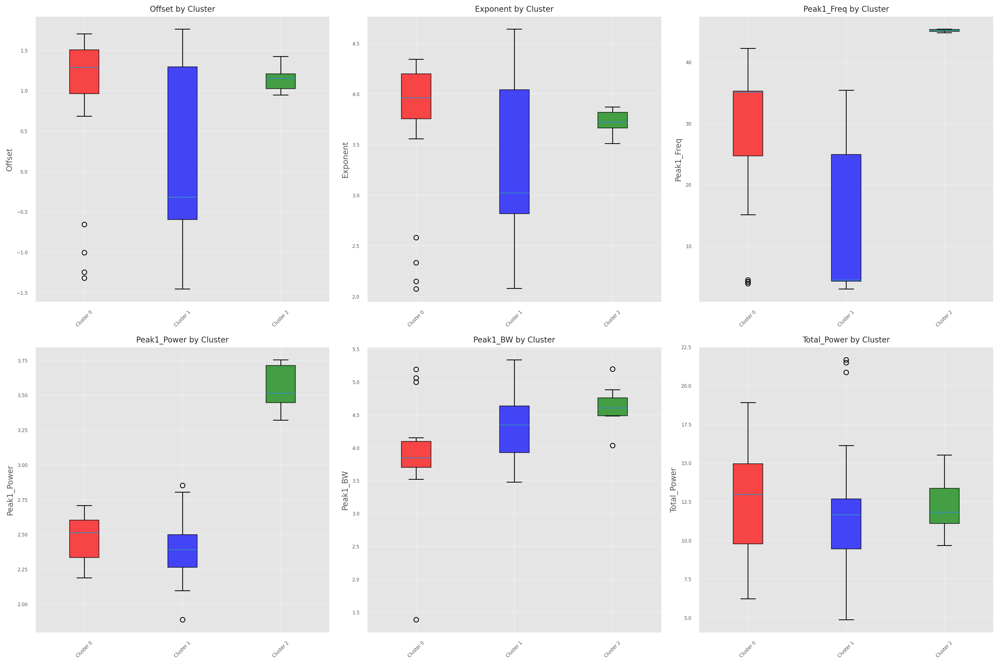


Statistical Comparison of FOOOF Features (F-test):
------------------------------------------------------------
Offset:
  F-statistic: 6.903
  p-value: 0.0019
  Very significant (p < 0.01)

Exponent:
  F-statistic: 2.834
  p-value: 0.0661
  Not significant (p ≥ 0.05)

Peak1_Freq:
  F-statistic: 33.008
  p-value: 0.0000
  Highly significant (p < 0.001)

Peak1_Power:
  F-statistic: 122.109
  p-value: 0.0000
  Highly significant (p < 0.001)

Peak1_BW:
  F-statistic: 5.753
  p-value: 0.0050
  Very significant (p < 0.01)

Total_Power:
  F-statistic: 0.661
  p-value: 0.5199
  Not significant (p ≥ 0.05)


Cluster Spectral Signatures

Cluster 0 Spectral Signature (22 neurons):
Aperiodic Background:
Offset (baseline power): 0.903 ± 0.961
Exponent (1/f slope): 3.729 ± 0.714
Interpretation: Shallow 1/f slope - inhibition-dominated
Oscillatory Peaks (2 detected):
     Peak 1: 27.1 Hz, Power: 2.470, BW: 3.894
     Peak 2: 45.2 Hz, Power: 3.612, BW: 4.555
Overall signature: High baseline power, Sha

In [ ]:
compare_fooof_across_clusters(clusters, fooof_features)
identify_cluster_spectral_signatures(clusters, fooof_features)


Detailed FOOOF Feature Comparison Across Clusters


/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' 

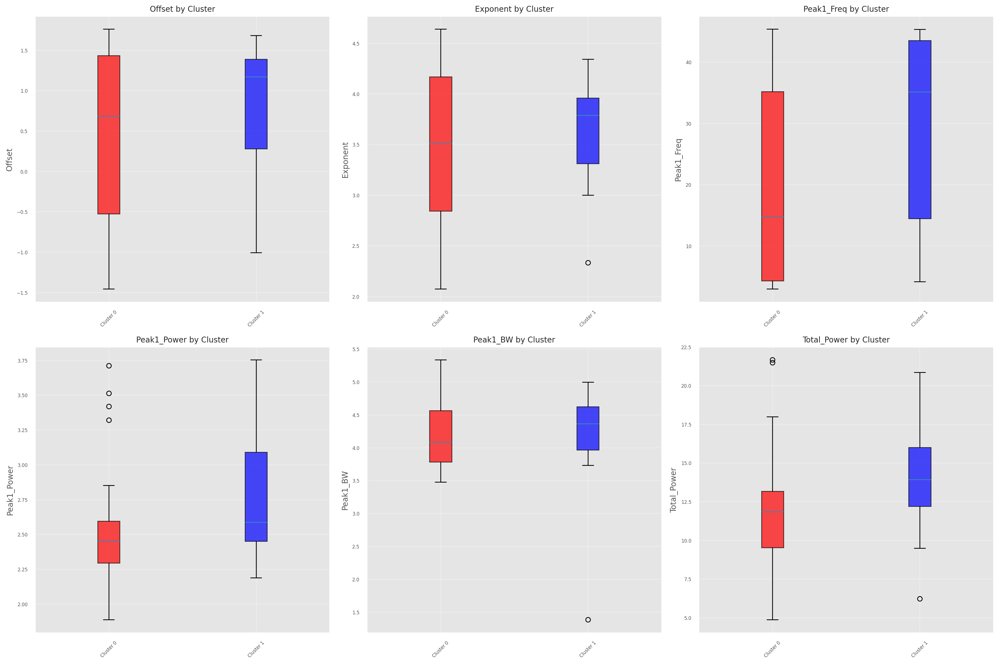


Statistical Comparison of FOOOF Features (F-test):
------------------------------------------------------------
Offset:
  F-statistic: 1.186
  p-value: 0.2802
  Not significant (p ≥ 0.05)

Exponent:
  F-statistic: 0.461
  p-value: 0.4995
  Not significant (p ≥ 0.05)

Peak1_Freq:
  F-statistic: 4.604
  p-value: 0.0356
  Significant (p < 0.05)

Peak1_Power:
  F-statistic: 6.279
  p-value: 0.0147
  Significant (p < 0.05)

Peak1_BW:
  F-statistic: 0.416
  p-value: 0.5209
  Not significant (p ≥ 0.05)

Total_Power:
  F-statistic: 3.889
  p-value: 0.0528
  Not significant (p ≥ 0.05)


Cluster Spectral Signatures

Cluster 0 Spectral Signature (57 neurons):
Aperiodic Background:
Offset (baseline power): 0.408 ± 1.044
Exponent (1/f slope): 3.460 ± 0.755
Interpretation: Shallow 1/f slope - inhibition-dominated
Oscillatory Peaks (3 detected):
     Peak 1: 18.2 Hz, Power: 2.491, BW: 4.223
     Peak 2: 37.6 Hz, Power: 2.875, BW: 4.034
     Peak 3: 45.4 Hz, Power: 3.722, BW: 4.396
Overall signature:

In [ ]:
compare_fooof_across_clusters(clusters_latent, fooof_features)
identify_cluster_spectral_signatures(clusters_latent, fooof_features)

In [ ]:
from scipy.stats import pearsonr
def analyze_sca_factors(model, centered_rates, fooof_features):
    """
    Validate that SCA factors correspond to spectral specializations
    """
    latent_features = get_latent_features(model, centered_rates)
    
    sparsity_per_factor = np.mean(np.abs(latent_features) < 0.1, axis=0)
    print("Factor sparsity (% near zero):", sparsity_per_factor)
    
    
    for factor_idx in range(latent_features.shape[1]):
        factor_activations = latent_features[:, factor_idx]
        
        correlations = []
        for fooof_dim in range(fooof_features.shape[1]):
            corr, _ = pearsonr(factor_activations, fooof_features[:, fooof_dim])
            correlations.append(corr)
        
        best_fooof_feature = np.argmax(np.abs(correlations))
        print(f"Factor {factor_idx}: Best FOOOF correlation = {correlations[best_fooof_feature]:.3f} "
              f"with feature {best_fooof_feature}")


analyze_sca_factors(model_sparseTrained, standardize_raw_features, foof_features)


Factor sparsity (% near zero): [1.         0.42647059 1.         1.         1.         1.
 1.         1.        ]
Factor 0: Best FOOOF correlation = 0.209 with feature 7
Factor 1: Best FOOOF correlation = -0.227 with feature 3
Factor 2: Best FOOOF correlation = -0.179 with feature 12
Factor 3: Best FOOOF correlation = -0.280 with feature 4
Factor 4: Best FOOOF correlation = -0.190 with feature 7
Factor 5: Best FOOOF correlation = 0.160 with feature 7
Factor 6: Best FOOOF correlation = -0.248 with feature 4
Factor 7: Best FOOOF correlation = 0.214 with feature 7


Latent Space Interpretability Analysis

Most discriminative latent dimensions:
   Dimension 1: F-score = 1530.45, p-value = 0.0000
   Dimension 5: F-score = 7.80, p-value = 0.0009
   Dimension 3: F-score = 7.44, p-value = 0.0012
   Dimension 6: F-score = 6.06, p-value = 0.0039
   Dimension 2: F-score = 3.91, p-value = 0.0249


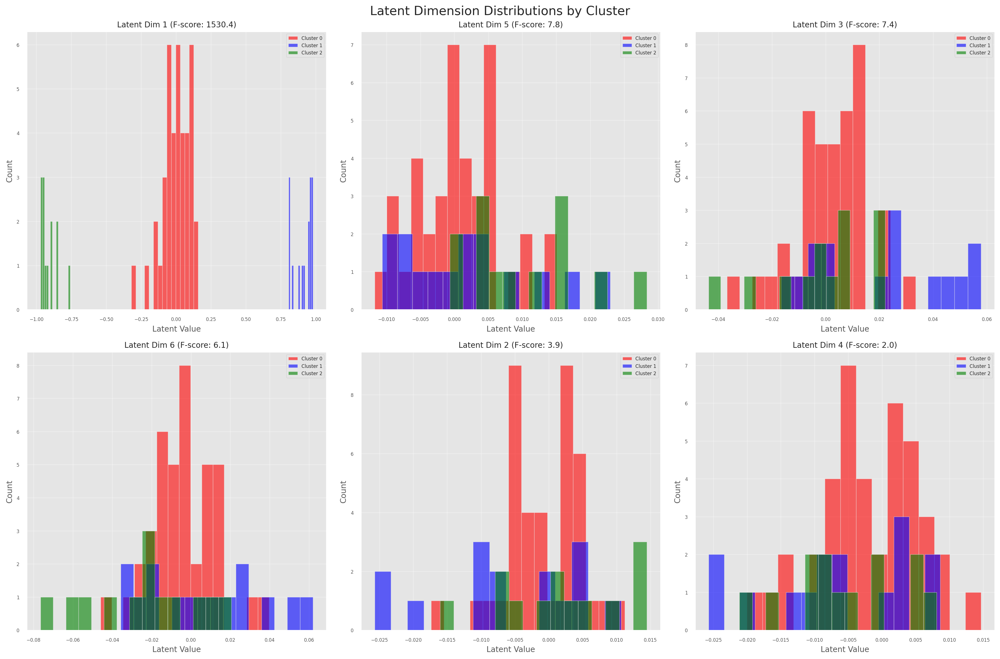


Cluster centroids in latent space:

Cluster 0 (n=40):
  Top 3 latent dimensions: [1 5 3]
    Dim 1: -0.001
    Dim 5: 0.001
    Dim 3: 0.002

Cluster 1 (n=15):
  Top 3 latent dimensions: [1 5 3]
    Dim 1: 0.911
    Dim 5: 0.002
    Dim 3: 0.021

Cluster 2 (n=13):
  Top 3 latent dimensions: [1 5 3]
    Dim 1: -0.912
    Dim 5: 0.010
    Dim 3: -0.001


(array([1, 5, 3, 6, 2, 4, 0, 7]),
 array([1.28943963e+00, 1.53044632e+03, 3.91163337e+00, 7.43732418e+00,
        2.00555503e+00, 7.79927570e+00, 6.06197095e+00, 6.71853992e-01]),
 array([[-4.94017545e-03,  9.72999707e-02, -1.89971691e-03,
          8.77409615e-03,  4.44623875e-03,  7.53405388e-04,
         -5.27239172e-03, -1.13924574e-02],
        [-1.16903409e-02,  8.17669481e-02,  8.65775906e-03,
         -7.11915176e-03,  7.62990210e-03, -5.02475305e-03,
         -2.45073978e-02, -2.67357398e-02],
        [-6.81129377e-03,  1.17351241e-01,  3.01944488e-03,
          1.01010094e-03,  2.58205994e-03,  2.36138632e-03,
         -8.57272558e-03, -7.98247848e-03],
        [-5.70449373e-03, -3.05150673e-02,  4.35454817e-03,
         -7.15410057e-03,  2.30722455e-03,  6.20763691e-04,
         -1.67207774e-02, -8.87574907e-03],
        [-2.86905421e-03,  1.11631528e-01, -6.82545709e-04,
          9.77685489e-03,  6.92333910e-04,  3.40615399e-04,
         -3.46008805e-03, -1.46538101e-03],


In [ ]:
interpret_latent_dimensions(model_sparseTrained, standardize_raw_features, sca_clusters, device)

In [ ]:
def save_sca_model(model, optimizer, epoch, seed, save_path):
    """
    Save complete SCA autoencoder state
    """
    checkpoint = {
        'input_size': model.encoder.input_size,
        'latent_size': model.encoder.latent_size,
        'dropout': model.encoder.dropout,
        
        'lambda_sparse': model.lambda_sparse,
        'lambda_orthogonal': model.lambda_orthogonal,

        'model_state_dict': model.state_dict(),

        'optimizer_state_dict': optimizer.state_dict(),
        
        'epoch': epoch,
        
        'model_class': 'SparseAutoencoder',

        'seed': seed
    }
    
    torch.save(checkpoint, save_path)
    print(f"Model saved to {save_path}")

In [ ]:
save_sca_model(
    model_sparseTrained, 
    model_sparseTrained.optim, 
    epoch=1000, 
    seed=1,  
    save_path='sparse_autoencoder_model_seed1.pth'
)

Model saved to sparse_autoencoder_model_seed1.pth


In [ ]:
def load_sca_model_simple(filename, input_size, device):
    """
    Simple model loading for inference
    """
    checkpoint = torch.load(filename, map_location=device)
    
    model = SparseAutoencoder(
        input_size=checkpoint['input_size'],
        latent_size=checkpoint['latent_size'],
        dropout=checkpoint['dropout'],
        lambda_sparse=checkpoint['lambda_sparse'],
        lambda_orthogonal=checkpoint['lambda_orthogonal']
    )
    print(f"Dropout rate: {model.encoder.dropout}")
    print(f"Lambda sparse: {model.lambda_sparse}")
    print(f"Lambda orthogonal: {model.lambda_orthogonal}")
    if checkpoint['seed'] is not None:
        print(f"Model Seed: {checkpoint['seed']}")
        seed = checkpoint['seed']
    
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()  # Set to evaluation mode
    
    print(f"Model loaded successfully from {filename}")
    return model, seed

In [ ]:

identify_cluster_spectral_signatures(sca_clusters, fooof_features)



Cluster Spectral Signatures

Cluster 0 Spectral Signature (40 neurons):
Aperiodic Background:
Offset (baseline power): 0.564 ± 0.955
Exponent (1/f slope): 3.565 ± 0.674
Interpretation: Shallow 1/f slope - inhibition-dominated
Oscillatory Peaks (3 detected):
     Peak 1: 21.5 Hz, Power: 2.585, BW: 4.130
     Peak 2: 38.9 Hz, Power: 2.927, BW: 4.103
     Peak 3: 45.5 Hz, Power: 3.716, BW: 4.443
Overall signature: High baseline power, Shallow 1/f slope - inhibition-dominated

Cluster 1 Spectral Signature (15 neurons):
Aperiodic Background:
Offset (baseline power): 0.450 ± 1.182
Exponent (1/f slope): 3.480 ± 0.860
Interpretation: Shallow 1/f slope - inhibition-dominated
Oscillatory Peaks (3 detected):
     Peak 1: 18.8 Hz, Power: 2.358, BW: 4.227
     Peak 2: 38.2 Hz, Power: 3.024, BW: 4.004
     Peak 3: 45.5 Hz, Power: 3.766, BW: 4.156
Overall signature: High baseline power, Shallow 1/f slope - inhibition-dominated

Cluster 2 Spectral Signature (13 neurons):
Aperiodic Background:
Offset 

In [ ]:
load_sca_model, seed_load = load_sca_model_simple('sca_robust2.pth', standardize_raw_features.shape[1], device)

Dropout rate: 0.2
Lambda sparse: 0.07
Lambda orthogonal: 0.08
Model Seed: 46
Model loaded successfully from sca_robust2.pth


In [ ]:
latent_sca = get_latent_features(
    load_sca_model,
    standardize_raw_features
)

Starting Neural Clustering Analysis...
Determining optimal number of clusters...


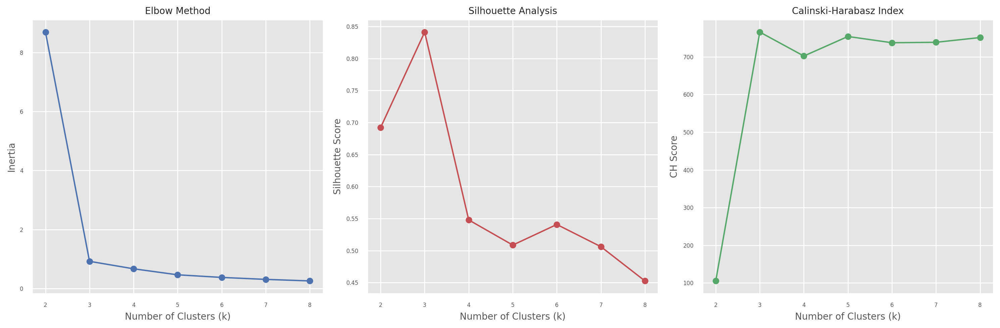

   Optimal k selected: 3 (silhouette score: 0.841)
Running single K-means clustering with k=3...
   Final silhouette score: 0.841


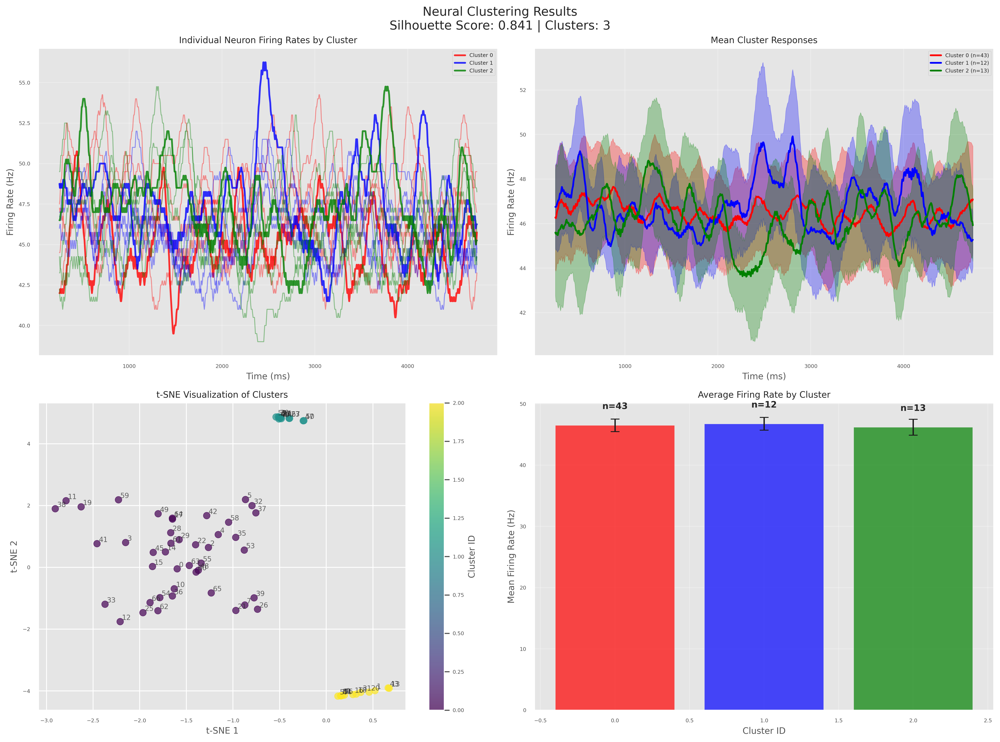


DETAILED CLUSTER ANALYSIS
--------------------------------------------------

Cluster 0: 43 neurons
  Neuron indices: [ 0  2  3  4  5  7 10 11 12 14]...
  Mean firing rate: 46.48 ± 1.02 Hz
  Rate range: 43.93 - 48.98 Hz
  Temporal variability: 2.12 ± 0.27

Cluster 1: 12 neurons
  Neuron indices: [ 6 23 24 27 30 34 40 46 47 50]...
  Mean firing rate: 46.75 ± 1.03 Hz
  Rate range: 45.38 - 48.57 Hz
  Temporal variability: 2.29 ± 0.21

Cluster 2: 13 neurons
  Neuron indices: [ 1  8  9 13 16 18 20 31 43 44]...
  Mean firing rate: 46.19 ± 1.30 Hz
  Rate range: 44.28 - 47.94 Hz
  Temporal variability: 2.37 ± 0.17

FINAL CLUSTER VALIDATION
   Silhouette Score: 0.841
   Number of Clusters: 3


In [ ]:
c_loaded, _, _ , _= neural_clustering(
    latent_sca,
    rates_per_neuronPC, times_vectorPC
)


Detailed FOOOF Feature Comparison Across Clusters


/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax.boxplot(cluster_data, labels=cluster_labels, patch_artist=True)
/tmp/ipykernel_15196/1666788227.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' 

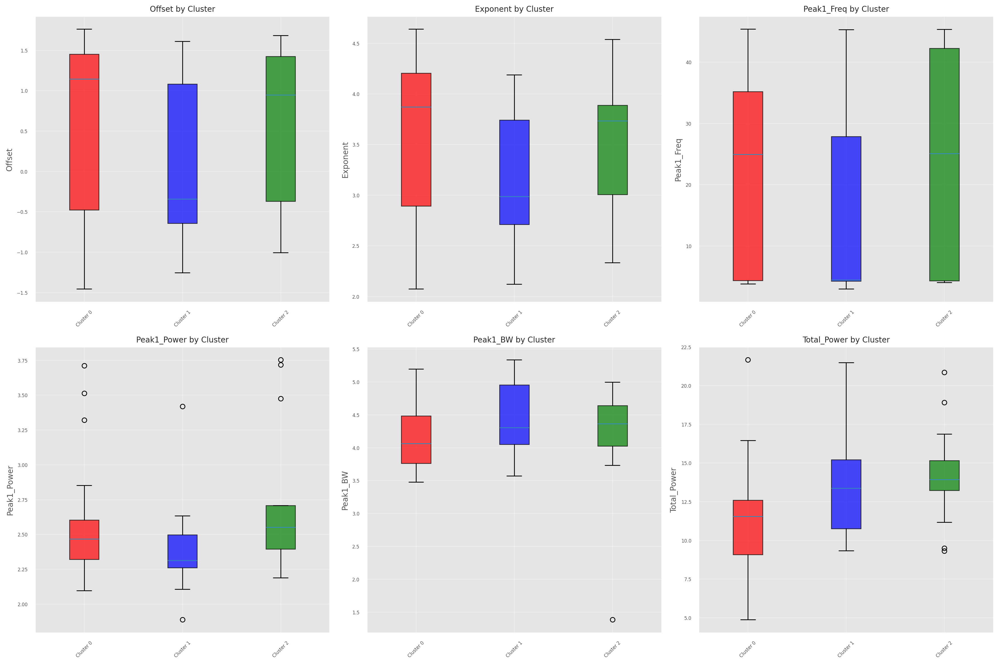


Statistical Comparison of FOOOF Features (F-test):
------------------------------------------------------------
Offset:
  F-statistic: 1.356
  p-value: 0.2649
  Not significant (p ≥ 0.05)

Exponent:
  F-statistic: 1.610
  p-value: 0.2077
  Not significant (p ≥ 0.05)

Peak1_Freq:
  F-statistic: 1.241
  p-value: 0.2958
  Not significant (p ≥ 0.05)

Peak1_Power:
  F-statistic: 2.828
  p-value: 0.0664
  Not significant (p ≥ 0.05)

Peak1_BW:
  F-statistic: 1.205
  p-value: 0.3063
  Not significant (p ≥ 0.05)

Total_Power:
  F-statistic: 6.625
  p-value: 0.0024
  Very significant (p < 0.01)


Cluster Spectral Signatures

Cluster 0 Spectral Signature (43 neurons):
Aperiodic Background:
Offset (baseline power): 0.541 ± 1.044
Exponent (1/f slope): 3.558 ± 0.756
Interpretation: Shallow 1/f slope - inhibition-dominated
Oscillatory Peaks (3 detected):
     Peak 1: 20.1 Hz, Power: 2.518, BW: 4.155
     Peak 2: 38.6 Hz, Power: 2.918, BW: 4.069
     Peak 3: 45.5 Hz, Power: 3.725, BW: 4.307
Overall s

In [ ]:
compare_fooof_across_clusters(c_loaded, foof_features)
identify_cluster_spectral_signatures(c_loaded, foof_features)

Latent Space Interpretability Analysis

Most discriminative latent dimensions:
   Dimension 3: F-score = 2380.38, p-value = 0.0000
   Dimension 0: F-score = 20.07, p-value = 0.0000
   Dimension 2: F-score = 5.37, p-value = 0.0069
   Dimension 4: F-score = 3.94, p-value = 0.0243
   Dimension 1: F-score = 3.76, p-value = 0.0285


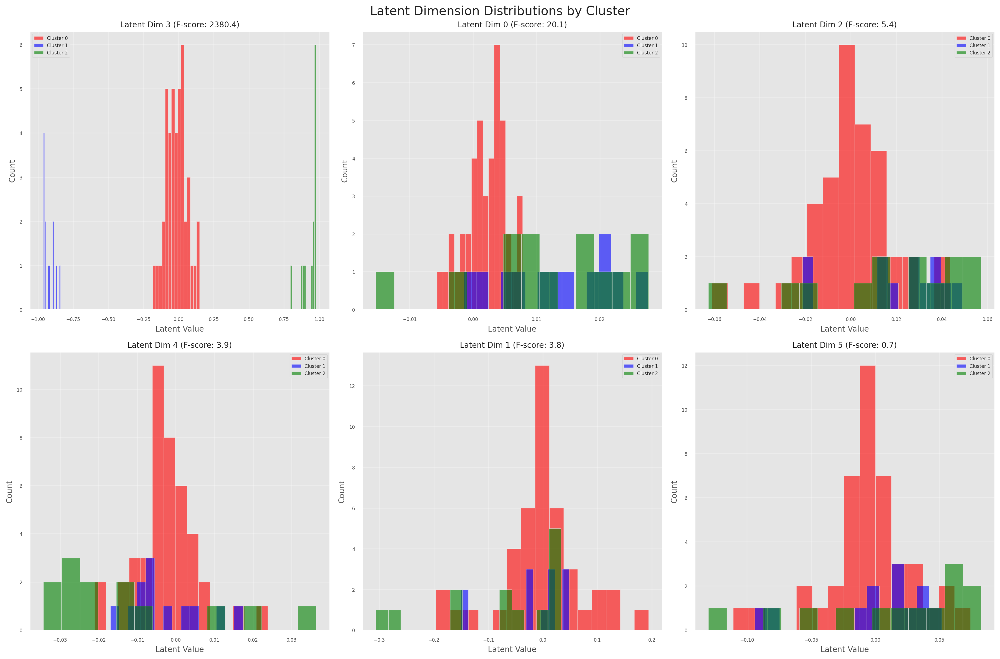


Cluster centroids in latent space:

Cluster 0 (n=43):
  Top 3 latent dimensions: [3 0 2]
    Dim 3: -0.013
    Dim 0: 0.002
    Dim 2: -0.001

Cluster 1 (n=12):
  Top 3 latent dimensions: [3 0 2]
    Dim 3: -0.923
    Dim 0: 0.014
    Dim 2: 0.021

Cluster 2 (n=13):
  Top 3 latent dimensions: [3 0 2]
    Dim 3: 0.935
    Dim 0: 0.012
    Dim 2: 0.016


(array([3, 0, 2, 4, 1, 5]),
 array([2.00674157e+01, 3.75827191e+00, 5.37421275e+00, 2.38038309e+03,
        3.93590620e+00, 6.54736180e-01]),
 array([[ 4.41065570e-03,  1.10722287e-03,  4.15708730e-03,
          1.79405622e-02, -4.89390455e-03, -2.11503962e-03],
        [-2.26726360e-03, -1.67291522e-01, -2.25174204e-02,
          8.86150718e-01,  1.00304773e-02, -5.13735153e-02],
        [ 1.31109660e-03,  2.36445968e-03, -3.49255721e-03,
         -3.48519273e-02, -1.15738017e-03, -8.19790363e-03],
        [ 2.58249207e-03, -5.93544468e-02, -1.21022703e-03,
         -7.91305210e-03, -1.04803930e-03, -7.57841952e-03],
        [-1.42103340e-03, -1.67753384e-03, -8.55018944e-03,
         -6.21314235e-02, -1.14446459e-03, -9.82917100e-03],
        [ 4.71634278e-03, -2.04704423e-03, -1.28380461e-02,
         -1.85306013e-01,  2.16270657e-03, -2.07869709e-02],
        [ 2.75768582e-02,  3.51663232e-02,  4.00650650e-02,
         -9.49045122e-01, -7.32957851e-03,  3.41057852e-02],
        [ 6

In [ ]:
interpret_latent_dimensions(load_sca_model, standardize_raw_features, c_loaded, device)